## Solar fucking panels

In [1]:
import sklearn as skl
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn import preprocessing
import datetime

*Load the CSV*

In [2]:
'''
Load CSVs
'''
energy2021 = pd.read_csv('daasbstp2023/energia_202109-202112.csv',na_values=[''])
energy2022 = pd.read_csv('daasbstp2023/energia_202201-202212.csv',na_values=[''])
energy2023 = pd.read_csv('daasbstp2023/energia_202301-202304.csv',na_values=[''])


metereologia2021 = pd.read_csv('daasbstp2023/meteo_202109-202112.csv',na_values=[''])
metereologia2022 = pd.read_csv('daasbstp2023/meteo_202201-202212.csv',na_values=[''])
metereologia2023 = pd.read_csv('daasbstp2023/meteo_202301-202304.csv',na_values=[''])



In [3]:
def cleanExtraTimeData(x):
    return x[:len("2022-01-01 00")]

metereologia2021['data_hora'] = metereologia2021['dt_iso'].apply(cleanExtraTimeData)
metereologia2022['data_hora'] = metereologia2022['dt_iso'].apply(cleanExtraTimeData)
metereologia2023['data_hora'] = metereologia2023['dt_iso'].apply(cleanExtraTimeData)

energy2021['data_hora'] = energy2021['Data'] + " " + energy2021['Hora'].apply(lambda x: str(x) if x>9 else "0"+str(x))
energy2022['data_hora'] = energy2022['Data'] + " " + energy2022['Hora'].apply(lambda x: str(x) if x>9 else "0"+str(x))
energy2023['data_hora'] = energy2023['Data'] + " " + energy2023['Hora'].apply(lambda x: str(x) if x>9 else "0"+str(x))

df2021 = pd.merge(energy2021, metereologia2021, on='data_hora', how='inner')
df2022 = pd.merge(energy2022, metereologia2022, on='data_hora', how='inner')

def separateDate(x):
    b=datetime.datetime.strptime(x, "%Y-%m-%d %H")
    return pd.Series({'Year':b.year,'Month':b.month,'Day':b.day,'Hour':b.hour})

df2021 = df2021.join(df2021['data_hora'].apply(separateDate))
df2022 = df2022.join(df2022['data_hora'].apply(separateDate))
df2021.info()


<class 'pandas.core.frame.DataFrame'>
Int64Index: 2256 entries, 0 to 2255
Data columns (total 26 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Data                     2256 non-null   object 
 1   Hora                     2256 non-null   int64  
 2   Normal (kWh)             2256 non-null   float64
 3   Horário Económico (kWh)  2256 non-null   float64
 4   Autoconsumo (kWh)        2256 non-null   float64
 5   Injeção na rede (kWh)    2256 non-null   object 
 6   data_hora                2256 non-null   object 
 7   dt                       2256 non-null   int64  
 8   dt_iso                   2256 non-null   object 
 9   city_name                2256 non-null   object 
 10  temp                     2256 non-null   float64
 11  feels_like               2256 non-null   float64
 12  temp_min                 2256 non-null   float64
 13  temp_max                 2256 non-null   float64
 14  pressure                

**1. Understand the data**

* .columns
* .head()
* .tail()
* .shape
*.dtypes
* .info()
* .describe()
* .isna()

In [4]:
'''
Inspect data
'''
display(df2021.columns)

Index(['Data', 'Hora', 'Normal (kWh)', 'Horário Económico (kWh)',
       'Autoconsumo (kWh)', 'Injeção na rede (kWh)', 'data_hora', 'dt',
       'dt_iso', 'city_name', 'temp', 'feels_like', 'temp_min', 'temp_max',
       'pressure', 'sea_level', 'grnd_level', 'humidity', 'wind_speed',
       'rain_1h', 'clouds_all', 'weather_description', 'Year', 'Month', 'Day',
       'Hour'],
      dtype='object')

In [5]:
display(df2021.head())

,Data,Hora,Normal (kWh),Horário Económico (kWh),Autoconsumo (kWh),Injeção na rede (kWh),data_hora,dt,dt_iso,city_name,...,grnd_level,humidity,wind_speed,rain_1h,clouds_all,weather_description,Year,Month,Day,Hour
0,2021-09-29,0,0.0,0.0,0.0,None,2021-09-29 00,1632873600,2021-09-29 00:00:00 +0000 UTC,local,...,NaN,81,1.96,NaN,87,overcast clouds,2021,9,29,0
1,2021-09-29,1,0.0,0.0,0.0,None,2021-09-29 01,1632877200,2021-09-29 01:00:00 +0000 UTC,local,...,NaN,82,1.83,NaN,91,overcast clouds,2021,9,29,1
2,2021-09-29,2,0.0,0.0,0.0,None,2021-09-29 02,1632880800,2021-09-29 02:00:00 +0000 UTC,local,...,NaN,84,1.96,NaN,93,overcast clouds,2021,9,29,2
3,2021-09-29,3,0.0,0.0,0.0,None,2021-09-29 03,1632884400,2021-09-29 03:00:00 +0000 UTC,local,...,NaN,85,1.85,NaN,95,overcast clouds,2021,9,29,3
4,2021-09-29,4,0.0,0.0,0.0,None,2021-09-29 04,1632888000,2021-09-29 04:00:00 +0000 UTC,local,...,NaN,86,1.83,NaN,93,overcast clouds,2021,9,29,4


In [6]:
display(df2021.tail())

,Data,Hora,Normal (kWh),Horário Económico (kWh),Autoconsumo (kWh),Injeção na rede (kWh),data_hora,dt,dt_iso,city_name,...,grnd_level,humidity,wind_speed,rain_1h,clouds_all,weather_description,Year,Month,Day,Hour
2251,2021-12-31,19,2.176,0.000,0.0,None,2021-12-31 19,1640977200,2021-12-31 19:00:00 +0000 UTC,local,...,NaN,73,3.05,NaN,91,overcast clouds,2021,12,31,19
2252,2021-12-31,20,0.732,0.000,0.0,None,2021-12-31 20,1640980800,2021-12-31 20:00:00 +0000 UTC,local,...,NaN,71,3.32,NaN,97,overcast clouds,2021,12,31,20
2253,2021-12-31,21,0.704,0.000,0.0,None,2021-12-31 21,1640984400,2021-12-31 21:00:00 +0000 UTC,local,...,NaN,67,3.43,NaN,94,overcast clouds,2021,12,31,21
2254,2021-12-31,22,0.000,0.424,0.0,None,2021-12-31 22,1640988000,2021-12-31 22:00:00 +0000 UTC,local,...,NaN,64,3.29,NaN,83,broken clouds,2021,12,31,22
2255,2021-12-31,23,0.000,0.432,0.0,None,2021-12-31 23,1640991600,2021-12-31 23:00:00 +0000 UTC,local,...,NaN,65,3.19,NaN,95,overcast clouds,2021,12,31,23


In [7]:
display(df2021.shape)

(2256, 26)

In [8]:
df2021.info()
df2022.info()


<class 'pandas.core.frame.DataFrame'>
Int64Index: 2256 entries, 0 to 2255
Data columns (total 26 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Data                     2256 non-null   object 
 1   Hora                     2256 non-null   int64  
 2   Normal (kWh)             2256 non-null   float64
 3   Horário Económico (kWh)  2256 non-null   float64
 4   Autoconsumo (kWh)        2256 non-null   float64
 5   Injeção na rede (kWh)    2256 non-null   object 
 6   data_hora                2256 non-null   object 
 7   dt                       2256 non-null   int64  
 8   dt_iso                   2256 non-null   object 
 9   city_name                2256 non-null   object 
 10  temp                     2256 non-null   float64
 11  feels_like               2256 non-null   float64
 12  temp_min                 2256 non-null   float64
 13  temp_max                 2256 non-null   float64
 14  pressure                

Many of the float64 to be converted to float32

In [9]:
df2021.describe()

,Hora,Normal (kWh),Horário Económico (kWh),Autoconsumo (kWh),dt,temp,feels_like,temp_min,temp_max,pressure,sea_level,grnd_level,humidity,wind_speed,rain_1h,clouds_all,Year,Month,Day,Hour
count,2256.000000,2256.000000,2256.000000,2256.000000,2.256000e+03,2256.000000,2256.000000,2256.000000,2256.000000,2256.000000,0.0,0.0,2256.000000,2256.000000,386.000000,2256.000000,2256.0,2256.000000,2256.000000,2256.000000
mean,11.500000,0.305831,0.123770,0.103501,1.636933e+09,14.230417,13.676990,12.718098,14.980576,1019.923759,NaN,NaN,78.767287,2.694233,0.902383,52.281915,2021.0,10.957447,16.127660,11.500000
std,6.923721,0.374957,0.310305,0.169716,2.345024e+06,4.337308,4.732605,4.292328,4.229657,5.351208,NaN,NaN,14.196262,1.366885,1.103337,41.012359,0.0,0.862090,8.980966,6.923721
min,0.000000,0.000000,0.000000,0.000000,1.632874e+09,2.590000,1.290000,-0.640000,4.040000,997.000000,NaN,NaN,27.000000,0.090000,0.110000,0.000000,2021.0,9.000000,1.000000,0.000000
25%,5.750000,0.000000,0.000000,0.000000,1.634903e+09,11.210000,10.420000,9.720000,11.820000,1017.000000,NaN,NaN,69.000000,1.760000,0.230000,5.000000,2021.0,10.000000,8.000000,5.750000
50%,11.500000,0.242000,0.000000,0.000000,1.636933e+09,13.965000,13.460000,12.570000,14.590000,1021.000000,NaN,NaN,82.000000,2.440000,0.500000,55.000000,2021.0,11.000000,16.000000,11.500000
75%,17.250000,0.459000,0.000000,0.213250,1.638962e+09,16.860000,16.790000,15.570000,17.720000,1024.000000,NaN,NaN,92.000000,3.430000,1.000000,97.000000,2021.0,12.000000,24.000000,17.250000
max,23.000000,2.540000,6.978000,1.016000,1.640992e+09,27.890000,28.530000,26.770000,27.930000,1031.000000,NaN,NaN,98.000000,11.100000,7.450000,100.000000,2021.0,12.000000,31.000000,23.000000


Check for missing values

In [10]:
'''
Missing data
'''
df2021.isnull().any()

Data                       False
Hora                       False
Normal (kWh)               False
Horário Económico (kWh)    False
Autoconsumo (kWh)          False
Injeção na rede (kWh)      False
data_hora                  False
dt                         False
dt_iso                     False
city_name                  False
temp                       False
feels_like                 False
temp_min                   False
temp_max                   False
pressure                   False
sea_level                   True
grnd_level                  True
humidity                   False
wind_speed                 False
rain_1h                     True
clouds_all                 False
weather_description        False
Year                       False
Month                      False
Day                        False
Hour                       False
dtype: bool

## 2023

In [11]:
energy2023.info()
metereologia2023.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2256 entries, 0 to 2255
Data columns (total 6 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Data                     2256 non-null   object 
 1   Hora                     2256 non-null   int64  
 2   Normal (kWh)             2256 non-null   float64
 3   Horário Económico (kWh)  2256 non-null   float64
 4   Autoconsumo (kWh)        2256 non-null   float64
 5   data_hora                2256 non-null   object 
dtypes: float64(3), int64(1), object(2)
memory usage: 105.9+ KB
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1752 entries, 0 to 1751
Data columns (total 16 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   dt                   1752 non-null   int64  
 1   dt_iso               1752 non-null   object 
 2   city_name            1752 non-null   object 
 3   temp                 1752 non-null  

Some metereological data is missing lets check out what data is missing

In [12]:
missingData2023 = pd.merge(energy2023, metereologia2023,on='data_hora', how='left', indicator=True)
# Get values in df1 but not in df2
missingDates2023 = missingData2023.loc[missingData2023['_merge'] != 'both','data_hora']
missingDates2023.value_counts().sort_index()

2023-03-15 00    1
2023-03-15 01    1
2023-03-15 02    1
2023-03-15 03    1
2023-03-15 04    1
                ..
2023-04-04 19    1
2023-04-04 20    1
2023-04-04 21    1
2023-04-04 22    1
2023-04-04 23    1
Name: data_hora, Length: 504, dtype: int64

Since is sequencial days and is full days we can't calculate averages of days around this date so we are going to use the data from the previous year for this days and using the average diference from the data we have in percentage to adapt the values

In [13]:
existingDates2023 = missingData2023.loc[missingData2023['_merge'] == 'both','data_hora']

mapped_existing_dates = existingDates2023.apply(lambda x: "2022" + x[4:])

t = metereologia2022[metereologia2022['data_hora'].isin(mapped_existing_dates)].copy()
t['data_hora'] = t['data_hora'].apply(lambda x: "2023" + x[4:])
t2 = metereologia2023.copy()
tt = t.select_dtypes(include='number')
t = pd.concat([t['data_hora'], tt], axis=1)
tt2 = t2.select_dtypes(include='number')
t2 = pd.concat([t2['data_hora'], tt2], axis=1)

t.dropna(axis=1, inplace=True)
t2.dropna(axis=1, inplace=True)

merged_df = pd.merge(t, t2, on='data_hora', suffixes=('2022', '2023'))
t.drop("data_hora", axis=1, inplace=True)
merged_df=merged_df.mean(axis=0,numeric_only=True)
metereologicChanges = pd.Series([])
for col in t.columns:
    metereologicChanges[col] = merged_df[col+"2023"]/merged_df[col+"2022"]
display(metereologicChanges)


/tmp/ipykernel_70143/4220097615.py:19: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  metereologicChanges = pd.Series([])


dt            1.019181
temp          0.954413
feels_like    0.947367
temp_min      0.949318
temp_max      0.969224
pressure      0.998565
humidity      1.005021
wind_speed    1.137967
clouds_all    0.892668
dtype: float64

# The dataset is composed of
- Normal (kWh) - The comsumption of eletricity in normal period from the grid
- Horário Económico (kWh) - The comsumption of eletricity in economic period from the grid
- Autoconsumo (kWh) - The comsumption of eletricity from the solar panels
- Injeção na rede (kWh) - The eletricity sent to the grid from the solar panels
- temp - Temperature in ºC
- feels_like - Thermal sensation in ºC
- temp_min - Minimal temperature felt in ºC
- temp_max - Maximum temperature felt in ºC
- pressure - atmosferic pressure
- sea_level - atmosferic pressure felt at sea level
- grnd_level - atmosferic pressure at the local ground level
- humidity - humidity percentage
- wind_speed - wind speed in meters/second
- rain_1h - precipitation average value
- clouds_all - cloudiness percentage
- weather_description - Qualititive description of the weather (might be able to become numeric)
- year - The year the data was collected on
- month - The month the data was collected on
- day - the day the data was collected on
- hour - the hour the data was collected on
- Data - the date the data was colllected on
- Hora - the hour the data was collected on
- dt - the timestamp the data was collected on
- dt_iso - the timestamp in iso standard the data was collected on
- city_name - the local where the data was gatherd

**2. Data preparation and transformation**

- drop useless columns
- rename columns 
- handle missing values
- create new features
- handle wrong data types
- remove outliers

## 2023 Preparation

In [14]:
mapped_missing_dates = missingDates2023.apply(lambda x: "2022" + x[4:])

exisitng = metereologia2023.copy()
t_existing = metereologia2022[metereologia2022['data_hora'].isin(mapped_existing_dates)].copy()

# Filter metereologia2022 based on the mapped dates and store them in a new DataFrame
t = metereologia2022[metereologia2022['data_hora'].isin(mapped_missing_dates)].copy()

# Update the dates in the 't' DataFrame to correspond to the year 2023
t['data_hora'] = t['data_hora'].apply(lambda x: "2023" + x[4:])

for i in metereologicChanges.index:
    t[i]=t[i]*metereologicChanges[i]
metereologia2023 = pd.concat([metereologia2023, t], ignore_index=True)



Now we can join the metereological data with energy usage

In [15]:
df2023 = pd.merge(energy2023, metereologia2023, on='data_hora', how='inner')
df2023 = df2023.join(df2023['data_hora'].apply(separateDate))

## general data preparation

- Since the city_name is always the same and there is no ground level pressure and sea level pressure data these columns where removed.
- data_hora was just used to join the weather to the power production so it can be removed
- Data and Hora have the same data as dt,dt_iso and year,month,day,hour so since year,month,day,hour gives us the most data we chose to eliminate the others
- Since preticipation has a lot os missing values and does not have a high correlation with the column to predict we decided to delete the column

In [16]:
df2021.drop(columns=['data_hora','Data','Hora','city_name','dt','dt_iso','grnd_level','sea_level','rain_1h'],inplace=True)
df2022.drop(columns=['data_hora','Data','Hora','city_name','dt','dt_iso','grnd_level','sea_level','rain_1h'],inplace=True)
df2023.drop(columns=['data_hora','Data','Hora','city_name','dt','dt_iso','grnd_level','sea_level','rain_1h'],inplace=True)

Rename all columns to english

In [17]:
new_column_names = {
    'Normal (kWh)': 'Normal',
    'Horário Económico (kWh)': 'Economical',
    'Autoconsumo (kWh)': 'Solar',
    'Injeção na rede (kWh)': 'Excess',
    'temp':'Temperature',
    'feels_like':'ThermalSensation',
    'temp_min':'MinTemperature',
    'temp_max':'MaxTemperature',
    'pressure':'Pressure',
    'humidity':'Humidity',
    'wind_speed':'WindSpeed',
    'rain_1h': 'Precipitation',
    'clouds_all':'Cloudiness',
    'weather_description':'Weather'
    }

# Use the .rename() method to rename specific columns
df2021 = df2021.rename(columns=new_column_names)
df2022 = df2022.rename(columns=new_column_names)
df2023 = df2023.rename(columns=new_column_names)

convert to categorical

In [18]:
for i in ['Excess','Weather']:
    df2021[i] = df2021[i].astype('category')
    df2022[i] = df2022[i].astype('category')
df2023['Weather'] = df2023['Weather'].astype('category')
df2021.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2256 entries, 0 to 2255
Data columns (total 17 columns):
 #   Column            Non-Null Count  Dtype   
---  ------            --------------  -----   
 0   Normal            2256 non-null   float64 
 1   Economical        2256 non-null   float64 
 2   Solar             2256 non-null   float64 
 3   Excess            2256 non-null   category
 4   Temperature       2256 non-null   float64 
 5   ThermalSensation  2256 non-null   float64 
 6   MinTemperature    2256 non-null   float64 
 7   MaxTemperature    2256 non-null   float64 
 8   Pressure          2256 non-null   int64   
 9   Humidity          2256 non-null   int64   
 10  WindSpeed         2256 non-null   float64 
 11  Cloudiness        2256 non-null   int64   
 12  Weather           2256 non-null   category
 13  Year              2256 non-null   int64   
 14  Month             2256 non-null   int64   
 15  Day               2256 non-null   int64   
 16  Hour              2256 n

In [19]:
for column in df2021.columns:
    if df2021[column].dtype == 'float64':
        df2021[column] = df2021[column].astype('float32')
for column in df2022.columns:
    if df2022[column].dtype == 'float64':
        df2022[column] = df2022[column].astype('float32')
for column in df2023.columns:
    if df2023[column].dtype == 'float64':
        df2023[column] = df2023[column].astype('float32')

**3. Univariate analysis**

Iterate through each and every relevant variable and get basic information such as

- .hist()
- .value_counts()
- .skew()
- .kurt()

## 2021 vs 2022

Column: Normal


count    2256.000000
mean        0.305831
std         0.374958
min         0.000000
25%         0.000000
50%         0.242000
75%         0.459000
max         2.540000
Name: Normal, dtype: float64

count    8760.000000
mean        0.175610
std         0.337521
min         0.000000
25%         0.000000
50%         0.000000
75%         0.239000
max         3.251000
Name: Normal, dtype: float64

Mean Difference: 0.13022098
Std Deviation Difference: 0.03743702173233032




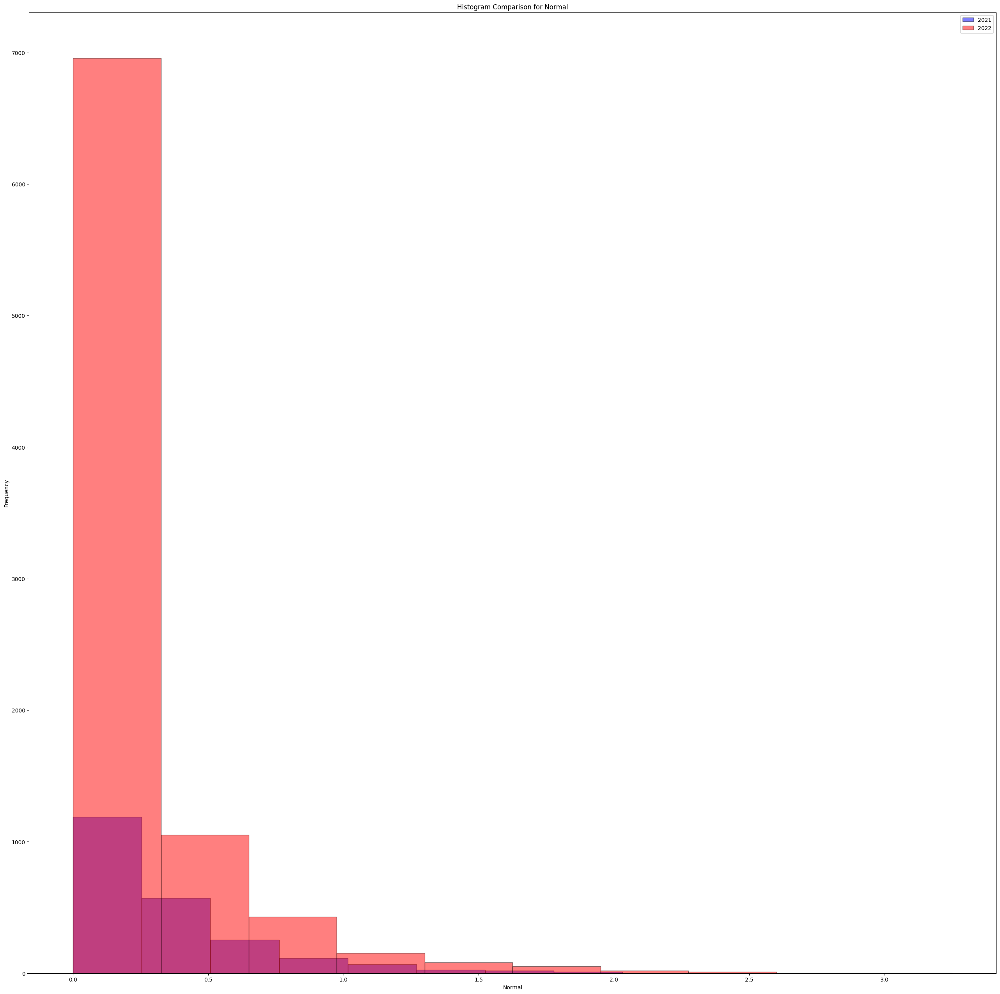

Column: Economical


count    2256.000000
mean        0.123770
std         0.310305
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         6.978000
Name: Economical, dtype: float64

count    8760.000000
mean        0.168971
std         0.260183
min         0.000000
25%         0.000000
50%         0.000000
75%         0.301000
max         2.667000
Name: Economical, dtype: float64

Mean Difference: 0.045201376
Std Deviation Difference: 0.05012226104736328




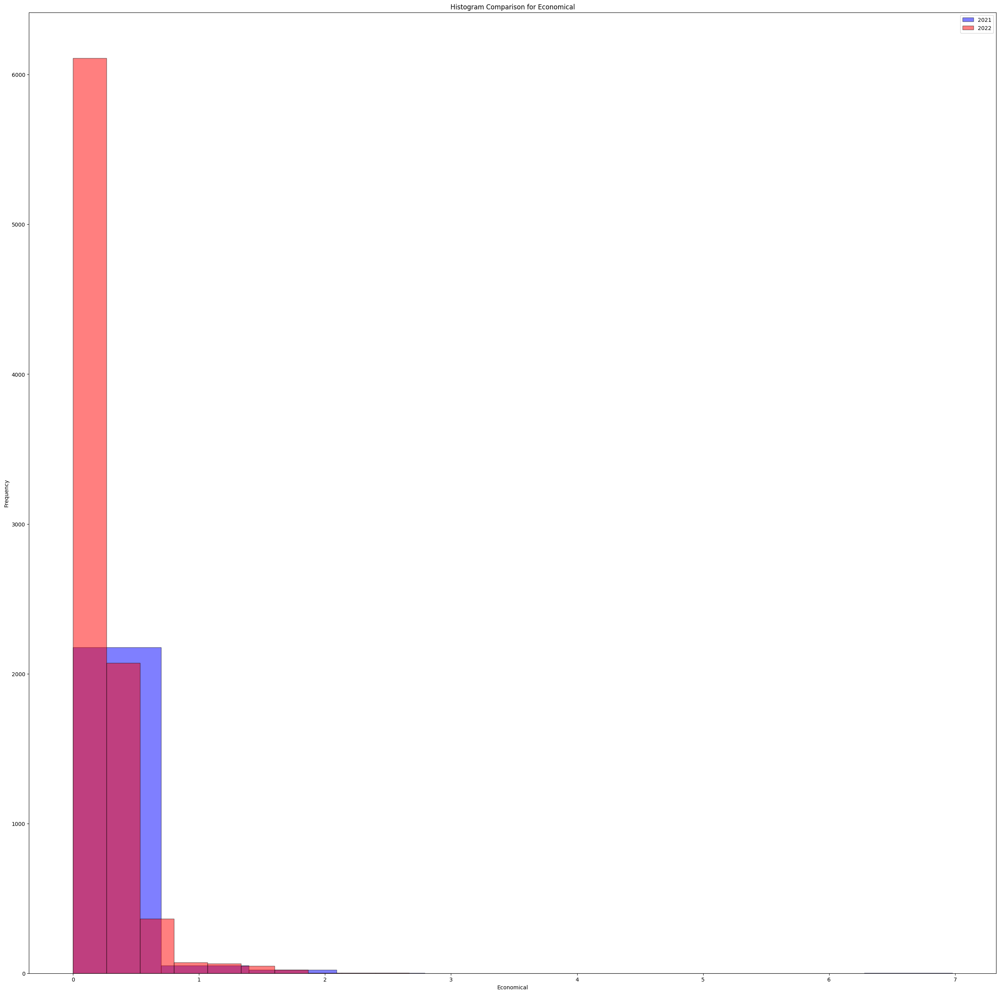

Column: Solar


count    2256.000000
mean        0.103501
std         0.169715
min         0.000000
25%         0.000000
50%         0.000000
75%         0.213250
max         1.016000
Name: Solar, dtype: float64

count    8760.000000
mean        0.120871
std         0.178367
min         0.000000
25%         0.000000
50%         0.001000
75%         0.229000
max         1.192000
Name: Solar, dtype: float64

Mean Difference: 0.017370038
Std Deviation Difference: 0.008652135729789734




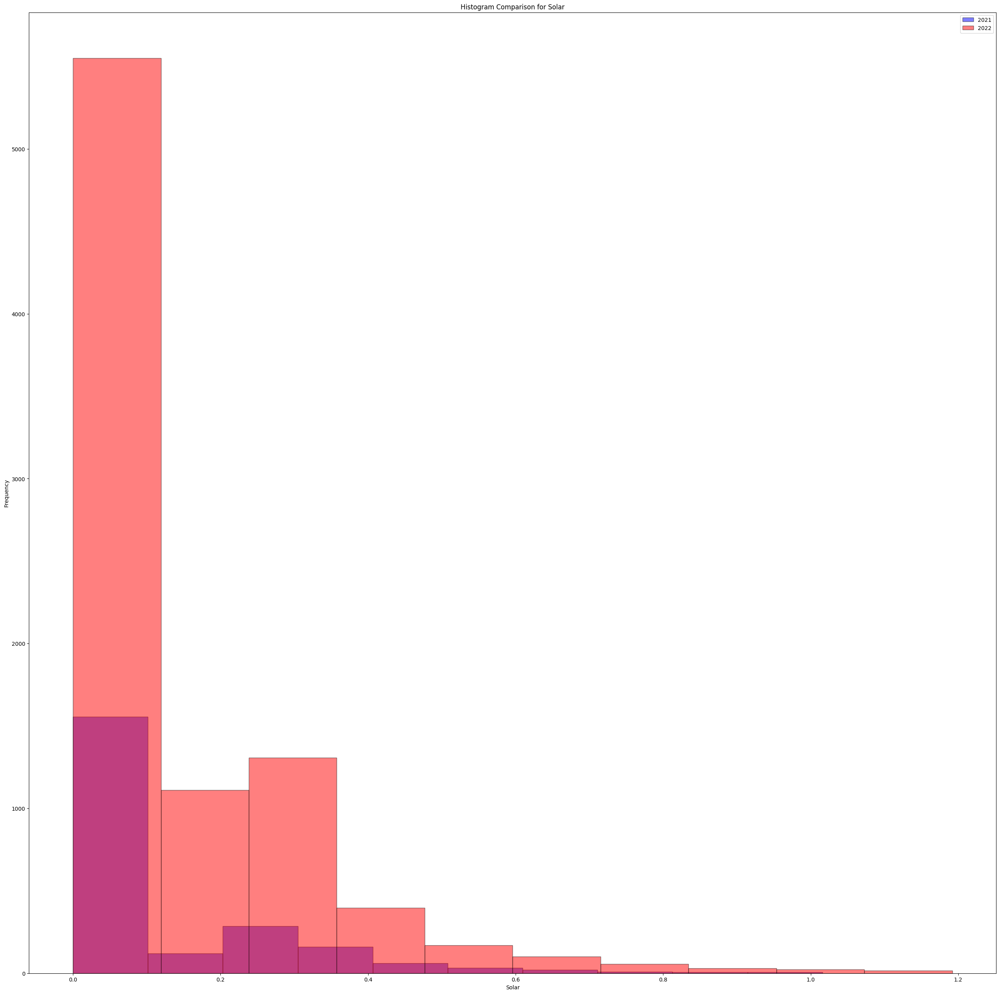

Column: Temperature


count    2256.000000
mean       14.230416
std         4.337308
min         2.590000
25%        11.210000
50%        13.965000
75%        16.860001
max        27.889999
Name: Temperature, dtype: float64

count    8760.000000
mean       16.685844
std         5.966657
min         0.320000
25%        12.400000
50%        16.129999
75%        19.930000
max        40.849998
Name: Temperature, dtype: float64

Mean Difference: 2.4554281
Std Deviation Difference: 1.6293487548828125




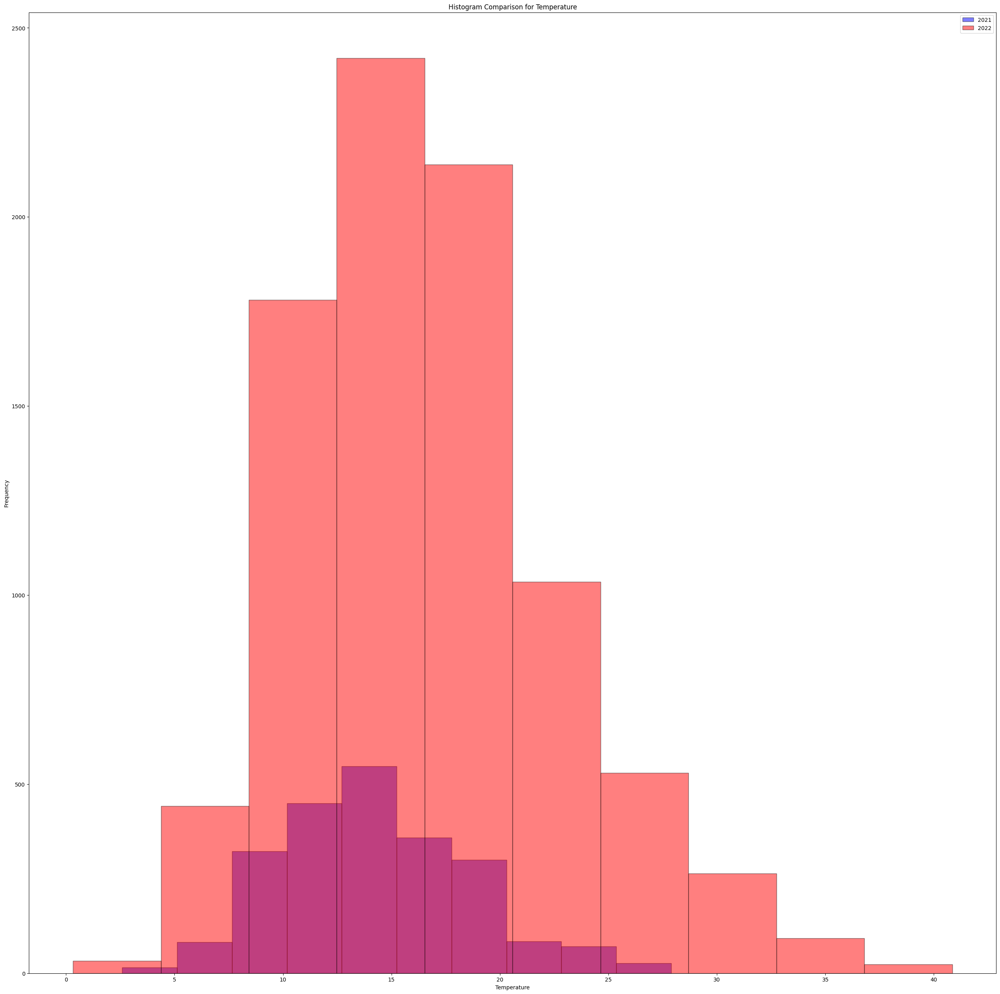

Column: ThermalSensation


count    2256.000000
mean       13.676990
std         4.732602
min         1.290000
25%        10.420000
50%        13.460000
75%        16.790001
max        28.530001
Name: ThermalSensation, dtype: float64

count    8760.000000
mean       16.380537
std         6.488003
min        -2.190000
25%        11.870000
50%        15.800000
75%        19.895000
max        41.330002
Name: ThermalSensation, dtype: float64

Mean Difference: 2.7035475
Std Deviation Difference: 1.7554011344909668




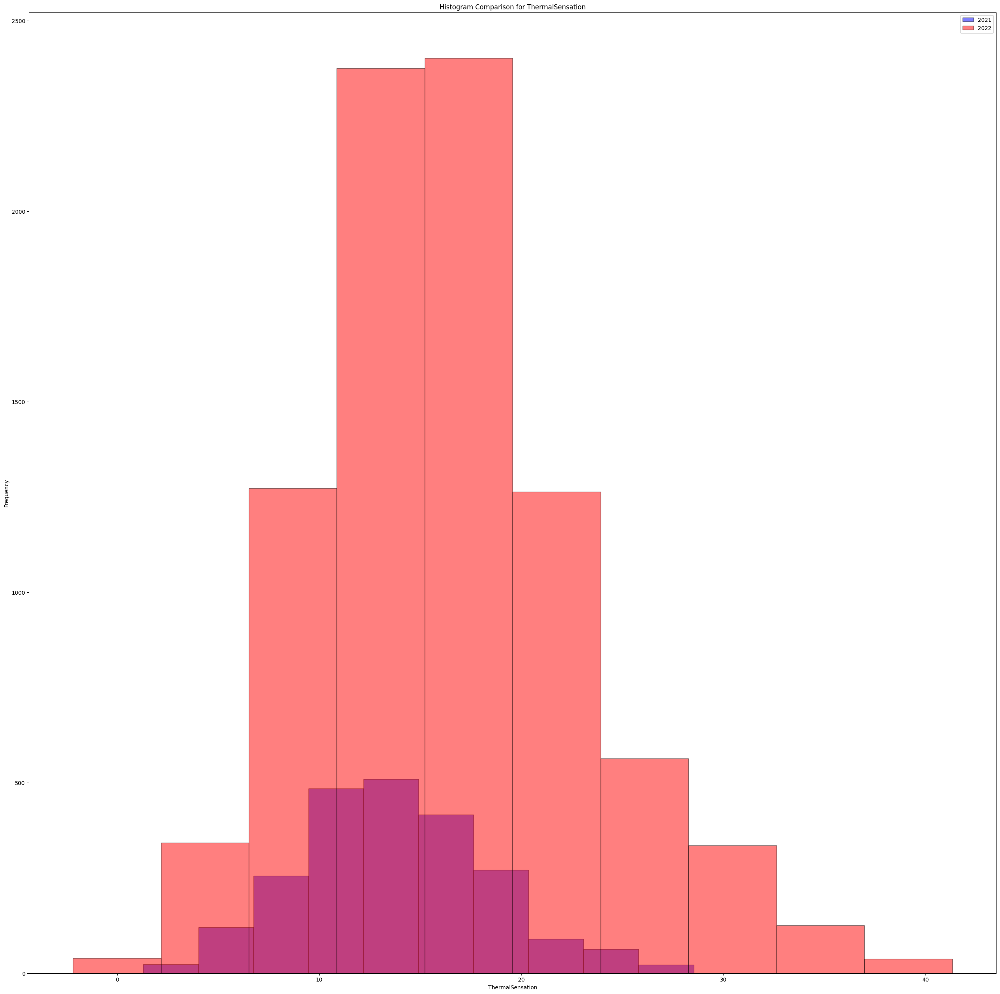

Column: MinTemperature


count    2256.000000
mean       12.718098
std         4.292327
min        -0.640000
25%         9.720000
50%        12.570000
75%        15.570000
max        26.770000
Name: MinTemperature, dtype: float64

count    8760.000000
mean       14.575434
std         5.043659
min        -0.590000
25%        11.120000
50%        14.720000
75%        17.719999
max        36.720001
Name: MinTemperature, dtype: float64

Mean Difference: 1.857336
Std Deviation Difference: 0.7513322830200195




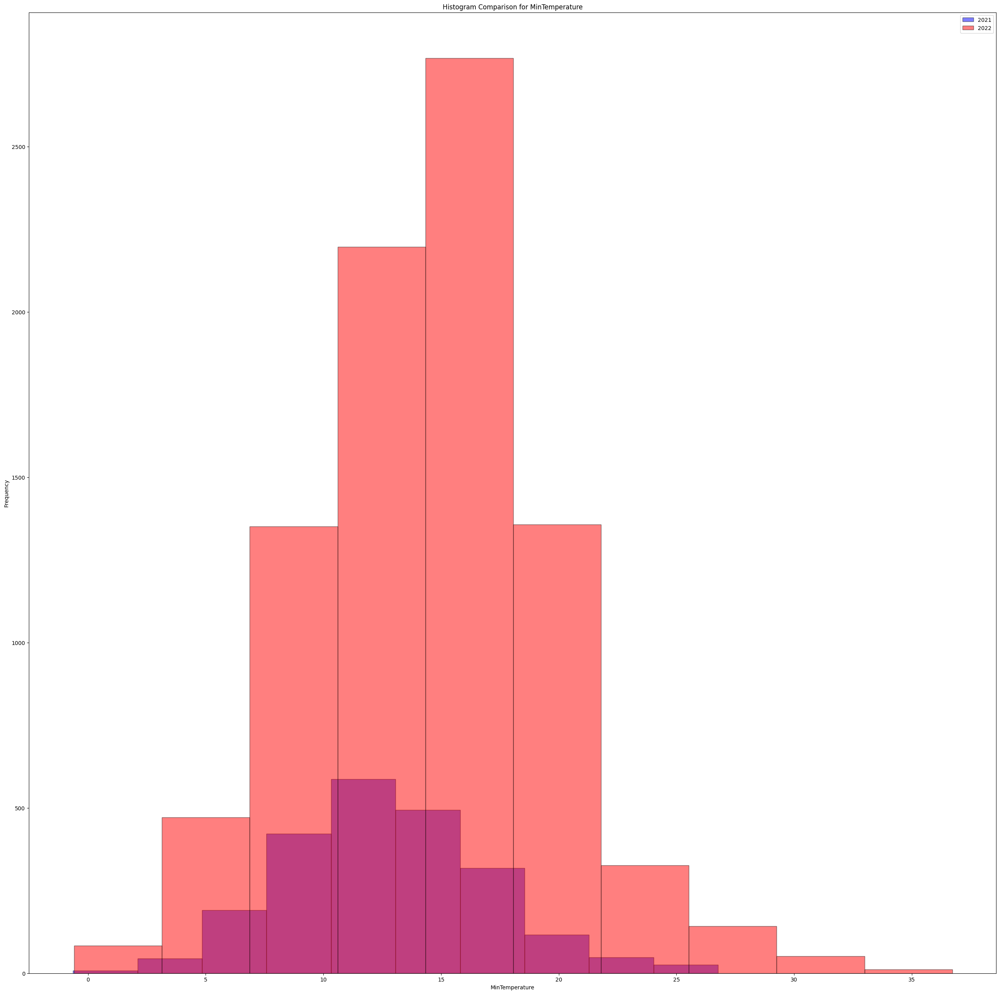

Column: MaxTemperature


count    2256.000000
mean       14.980577
std         4.229648
min         4.040000
25%        11.820000
50%        14.590000
75%        17.719999
max        27.930000
Name: MaxTemperature, dtype: float64

count    8760.000000
mean       17.882362
std         6.439008
min         1.330000
25%        13.292500
50%        16.820000
75%        21.365000
max        41.450001
Name: MaxTemperature, dtype: float64

Mean Difference: 2.9017859
Std Deviation Difference: 2.209360122680664




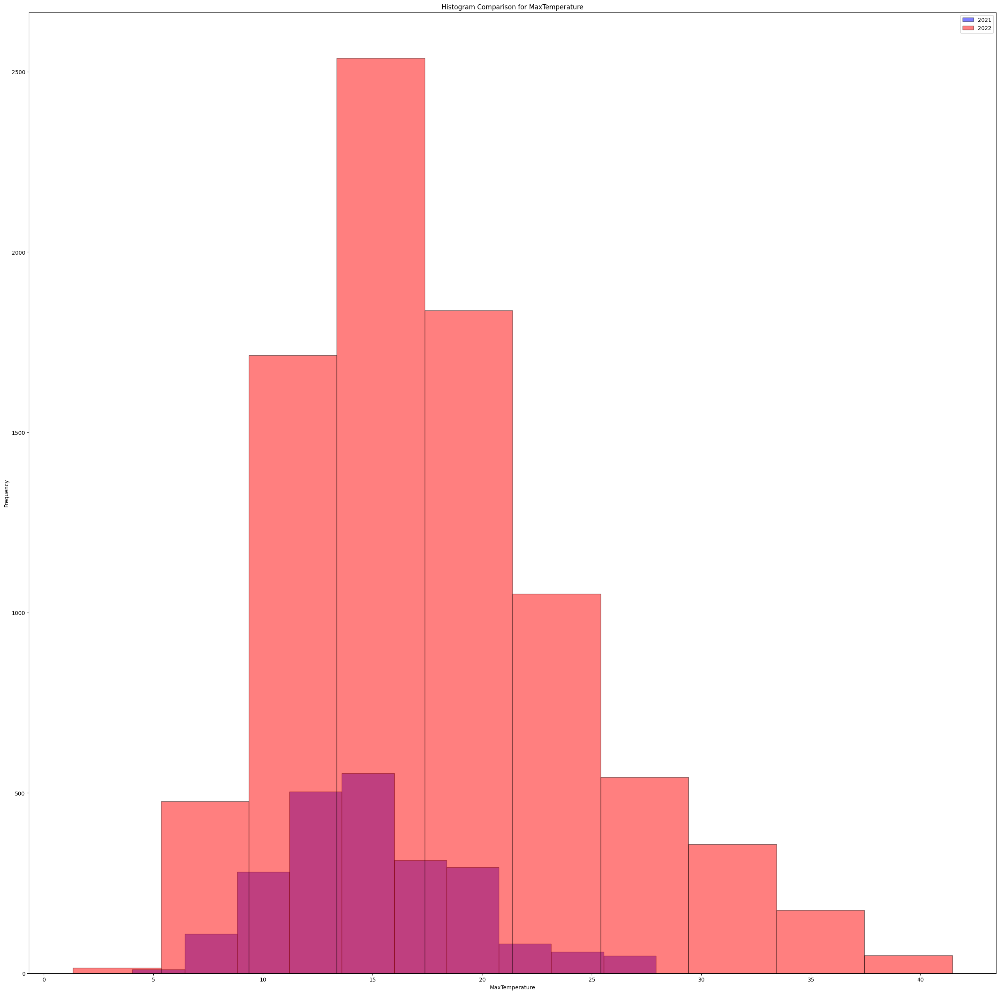

Column: Pressure


count    2256.000000
mean     1019.923759
std         5.351208
min       997.000000
25%      1017.000000
50%      1021.000000
75%      1024.000000
max      1031.000000
Name: Pressure, dtype: float64

count    8760.000000
mean     1018.003311
std         6.345541
min       994.000000
25%      1014.000000
50%      1018.000000
75%      1022.000000
max      1034.000000
Name: Pressure, dtype: float64

Mean Difference: 1.9204483629652032
Std Deviation Difference: 0.9943327774605857




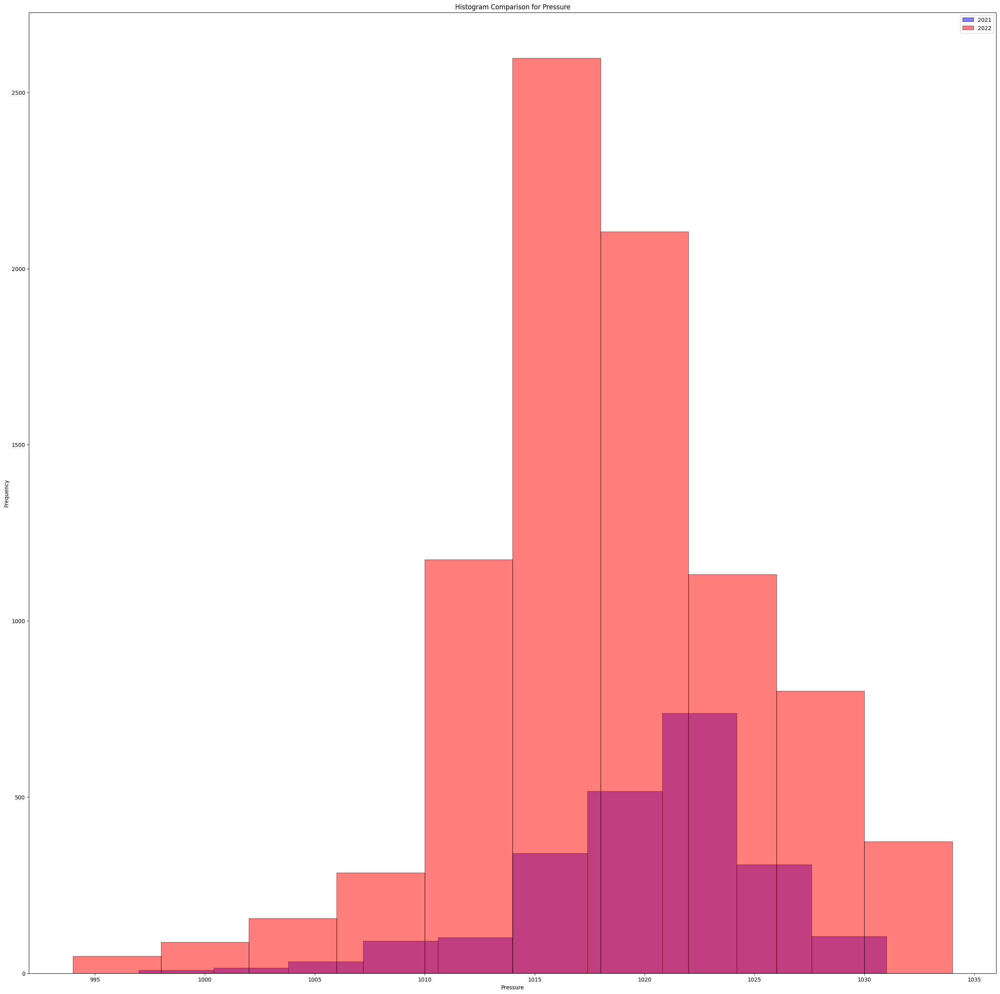

Column: Humidity


count    2256.000000
mean       78.767287
std        14.196262
min        27.000000
25%        69.000000
50%        82.000000
75%        92.000000
max        98.000000
Name: Humidity, dtype: float64

count    8760.000000
mean       76.005023
std        16.714502
min        19.000000
25%        65.000000
50%        80.000000
75%        90.000000
max       100.000000
Name: Humidity, dtype: float64

Mean Difference: 2.7622644029923293
Std Deviation Difference: 2.51823977645941




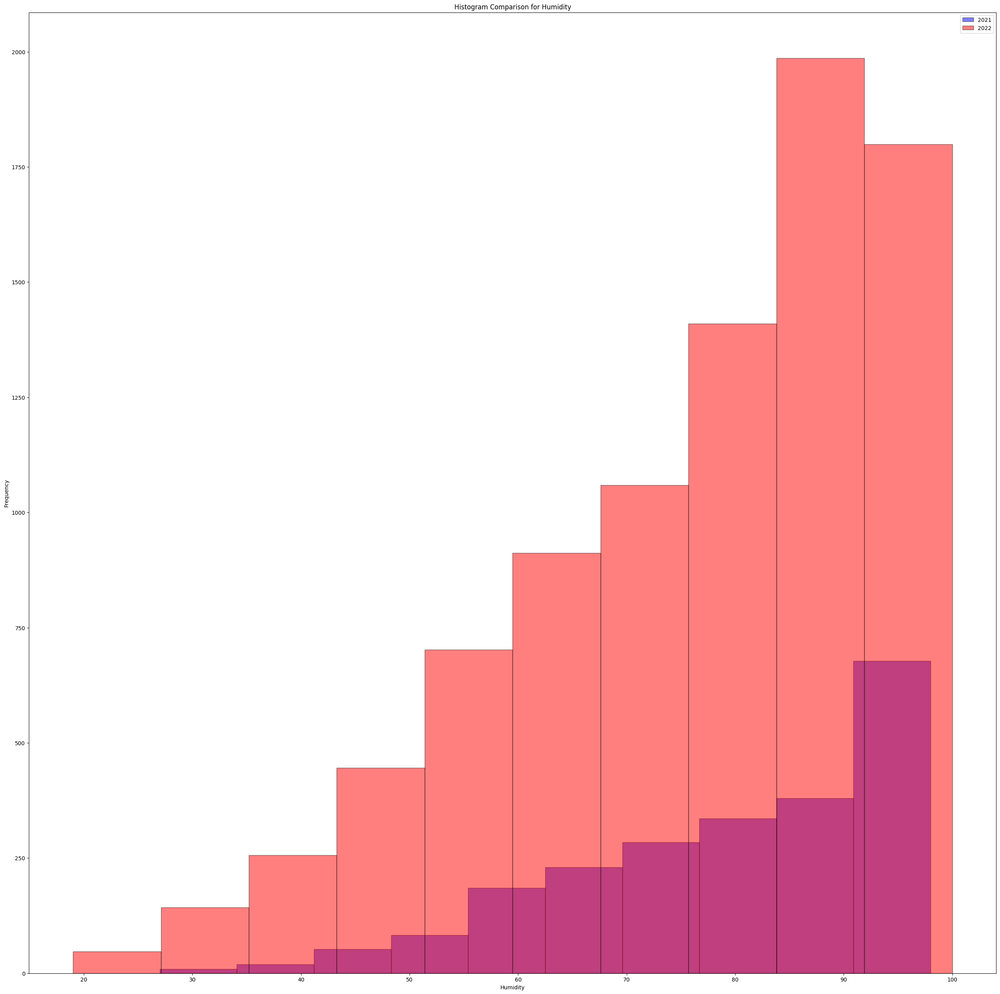

Column: WindSpeed


count    2256.000000
mean        2.694233
std         1.366885
min         0.090000
25%         1.760000
50%         2.440000
75%         3.430000
max        11.100000
Name: WindSpeed, dtype: float64

count    8760.000000
mean        2.666323
std         1.503032
min         0.060000
25%         1.580000
50%         2.400000
75%         3.420000
max        10.230000
Name: WindSpeed, dtype: float64

Mean Difference: 0.027910233
Std Deviation Difference: 0.1361478567123413




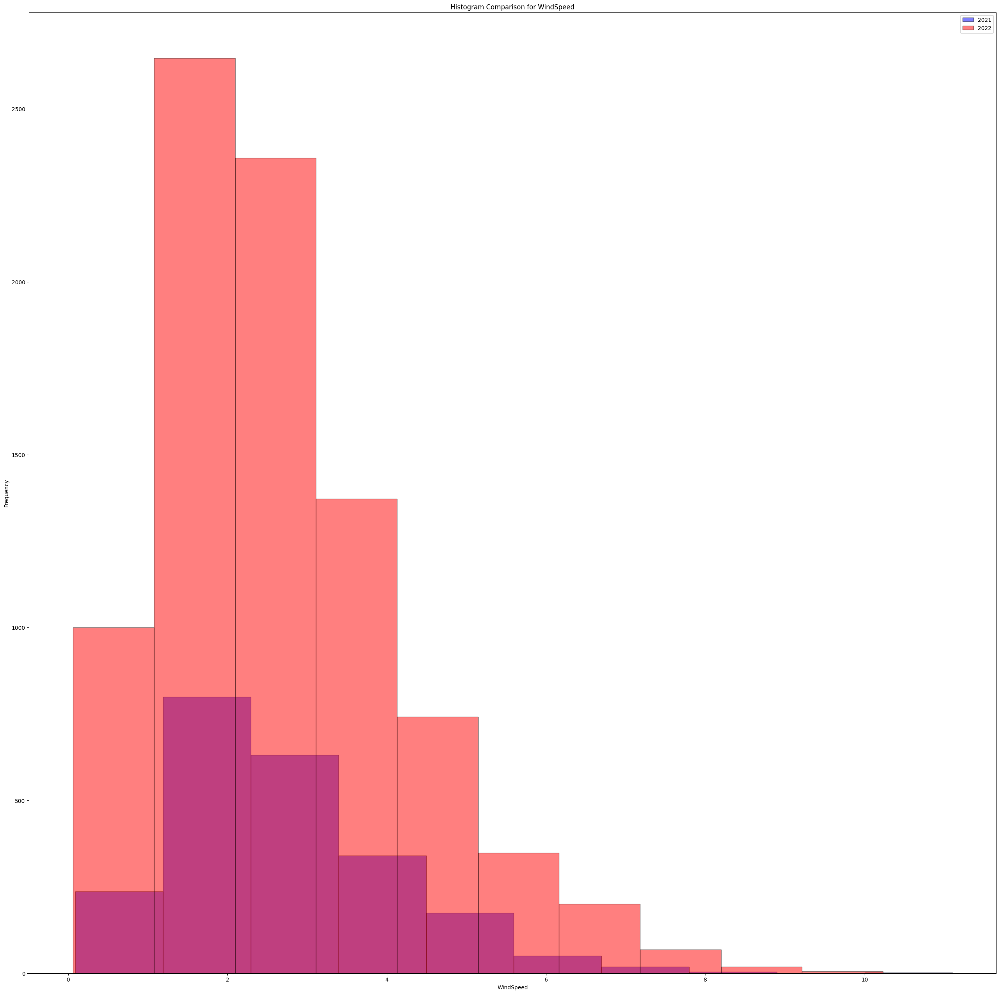

Column: Cloudiness


count    2256.000000
mean       52.281915
std        41.012359
min         0.000000
25%         5.000000
50%        55.000000
75%        97.000000
max       100.000000
Name: Cloudiness, dtype: float64

count    8760.000000
mean       54.443607
std        40.424382
min         0.000000
25%         7.000000
50%        61.000000
75%        98.000000
max       100.000000
Name: Cloudiness, dtype: float64

Mean Difference: 2.1616924123190557
Std Deviation Difference: 0.5879777346022834




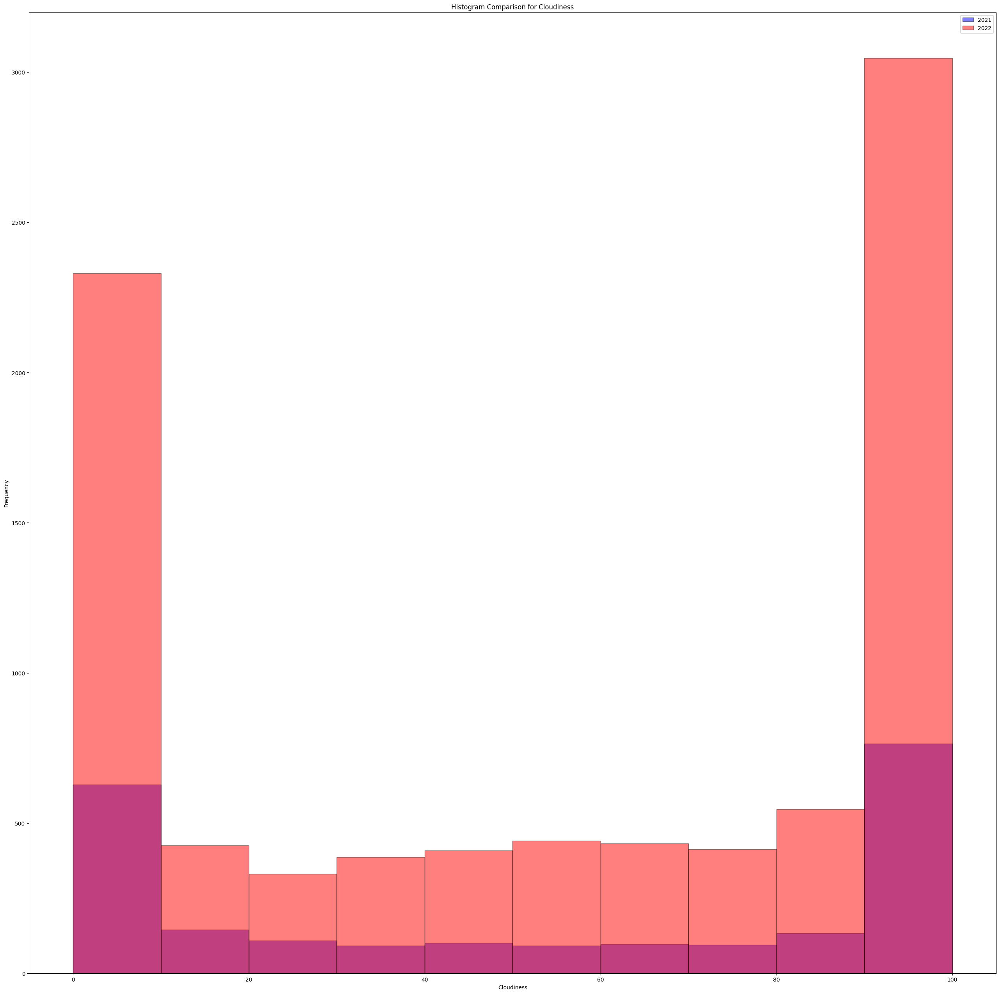

Column: Year


count    2256.0
mean     2021.0
std         0.0
min      2021.0
25%      2021.0
50%      2021.0
75%      2021.0
max      2021.0
Name: Year, dtype: float64

count    8760.0
mean     2022.0
std         0.0
min      2022.0
25%      2022.0
50%      2022.0
75%      2022.0
max      2022.0
Name: Year, dtype: float64

Mean Difference: 1.0
Std Deviation Difference: 0.0




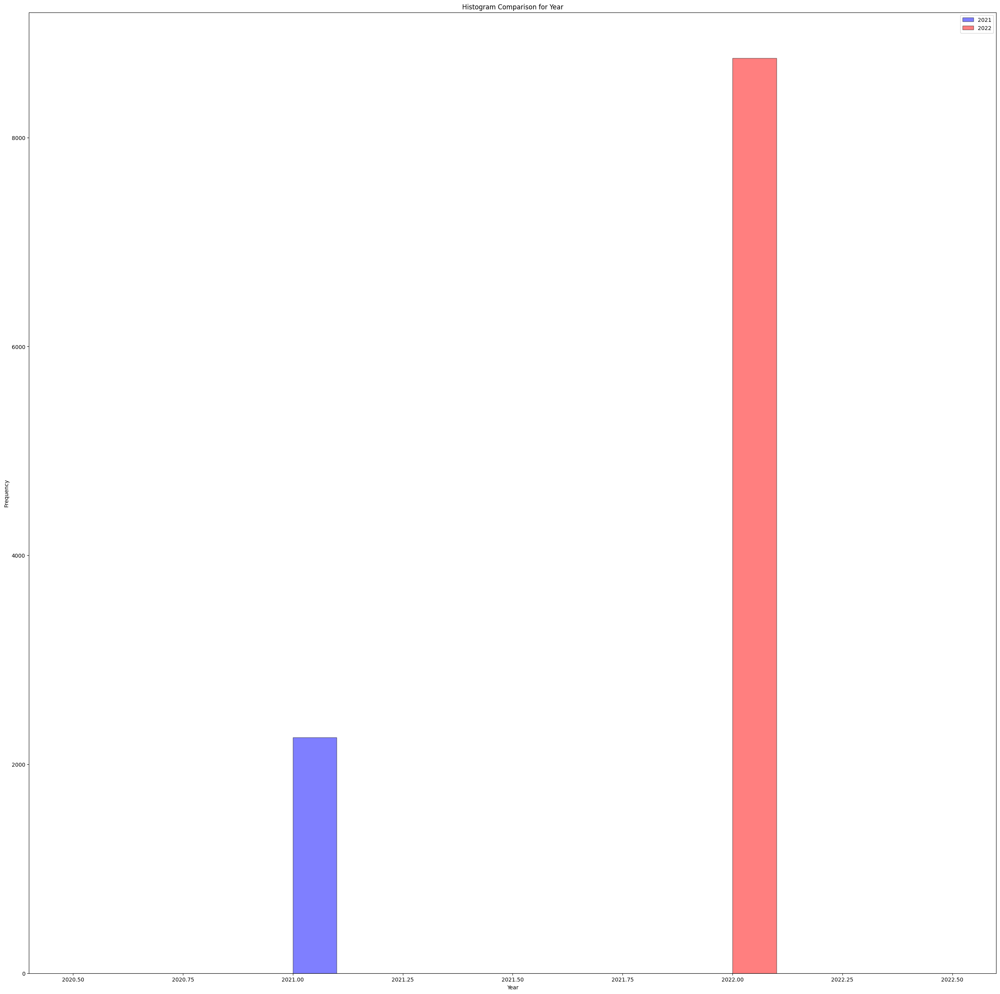

Column: Month


count    2256.000000
mean       10.957447
std         0.862090
min         9.000000
25%        10.000000
50%        11.000000
75%        12.000000
max        12.000000
Name: Month, dtype: float64

count    8760.000000
mean        6.526027
std         3.448048
min         1.000000
25%         4.000000
50%         7.000000
75%        10.000000
max        12.000000
Name: Month, dtype: float64

Mean Difference: 4.431419411250365
Std Deviation Difference: 2.5859579361407268




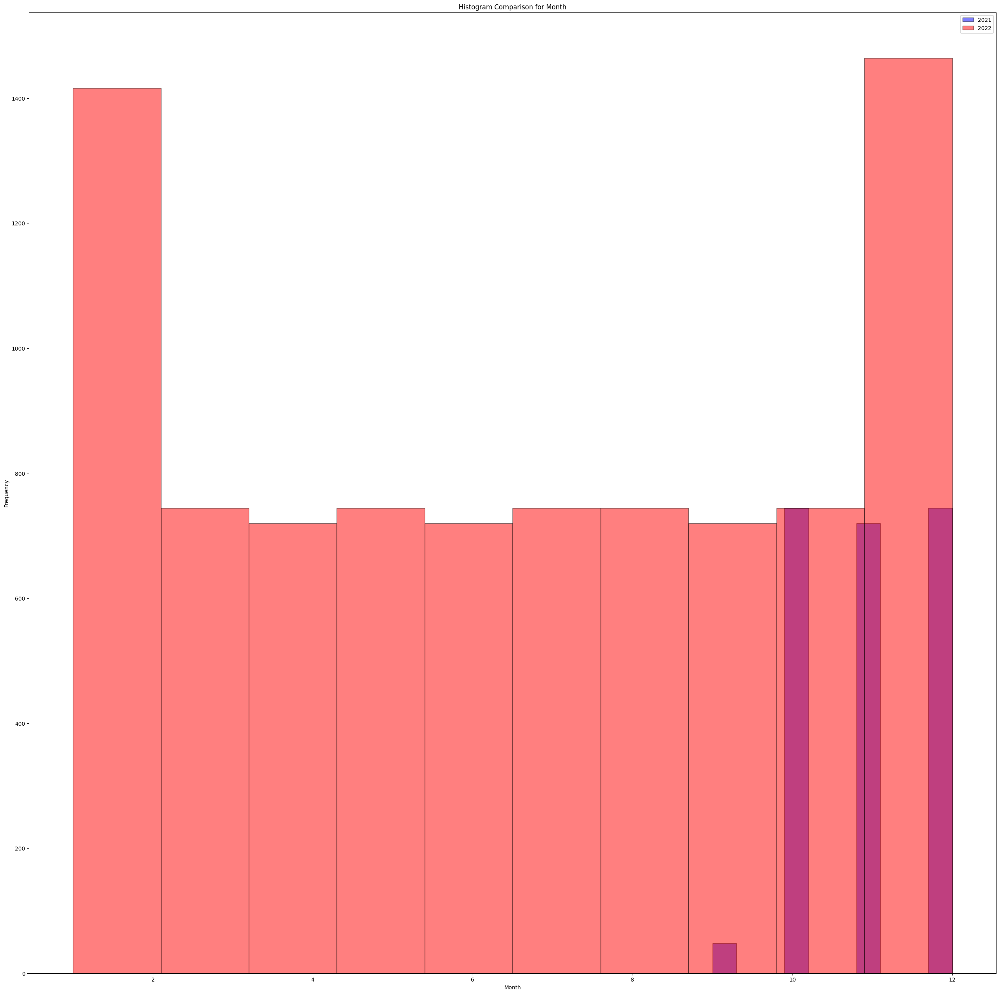

Column: Day


count    2256.000000
mean       16.127660
std         8.980966
min         1.000000
25%         8.000000
50%        16.000000
75%        24.000000
max        31.000000
Name: Day, dtype: float64

count    8760.000000
mean       15.720548
std         8.796749
min         1.000000
25%         8.000000
50%        16.000000
75%        23.000000
max        31.000000
Name: Day, dtype: float64

Mean Difference: 0.4071116292626069
Std Deviation Difference: 0.18421706085562306




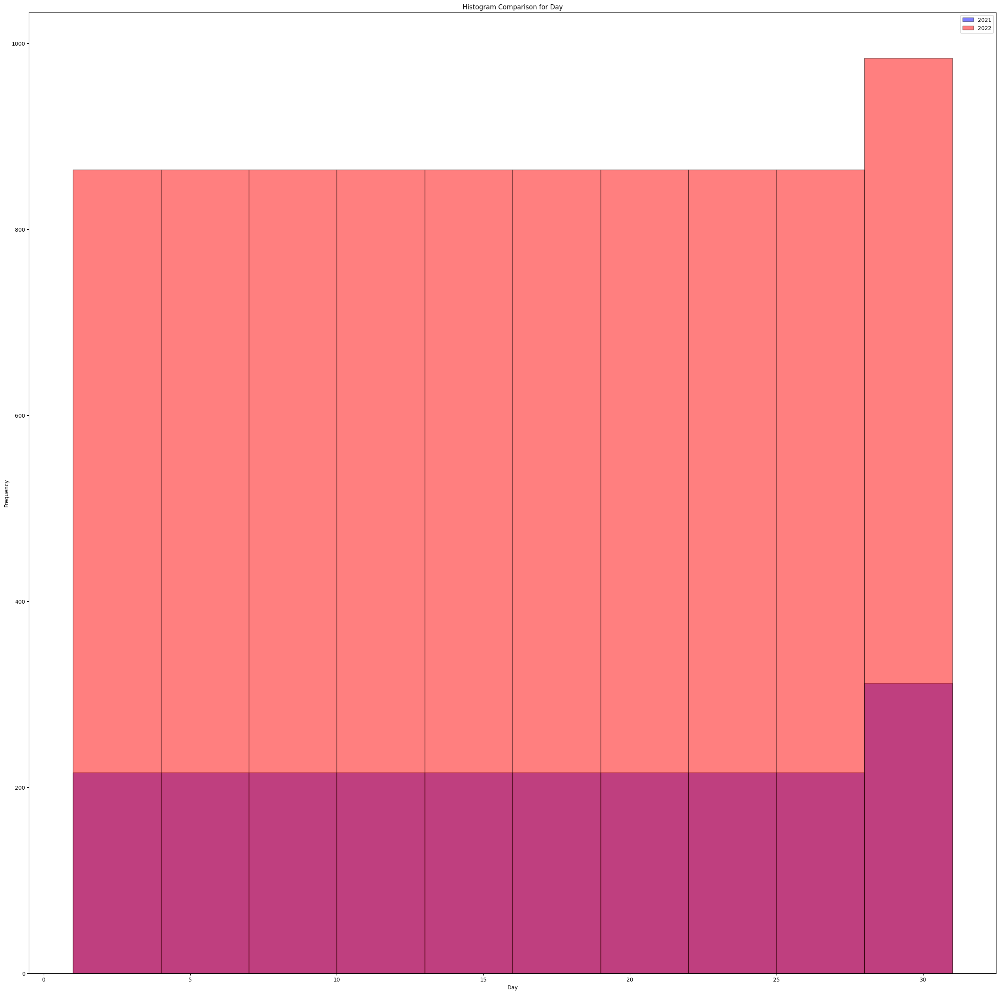

Column: Hour


count    2256.000000
mean       11.500000
std         6.923721
min         0.000000
25%         5.750000
50%        11.500000
75%        17.250000
max        23.000000
Name: Hour, dtype: float64

count    8760.000000
mean       11.500000
std         6.922582
min         0.000000
25%         5.750000
50%        11.500000
75%        17.250000
max        23.000000
Name: Hour, dtype: float64

Mean Difference: 0.0
Std Deviation Difference: 0.0011395469681412251




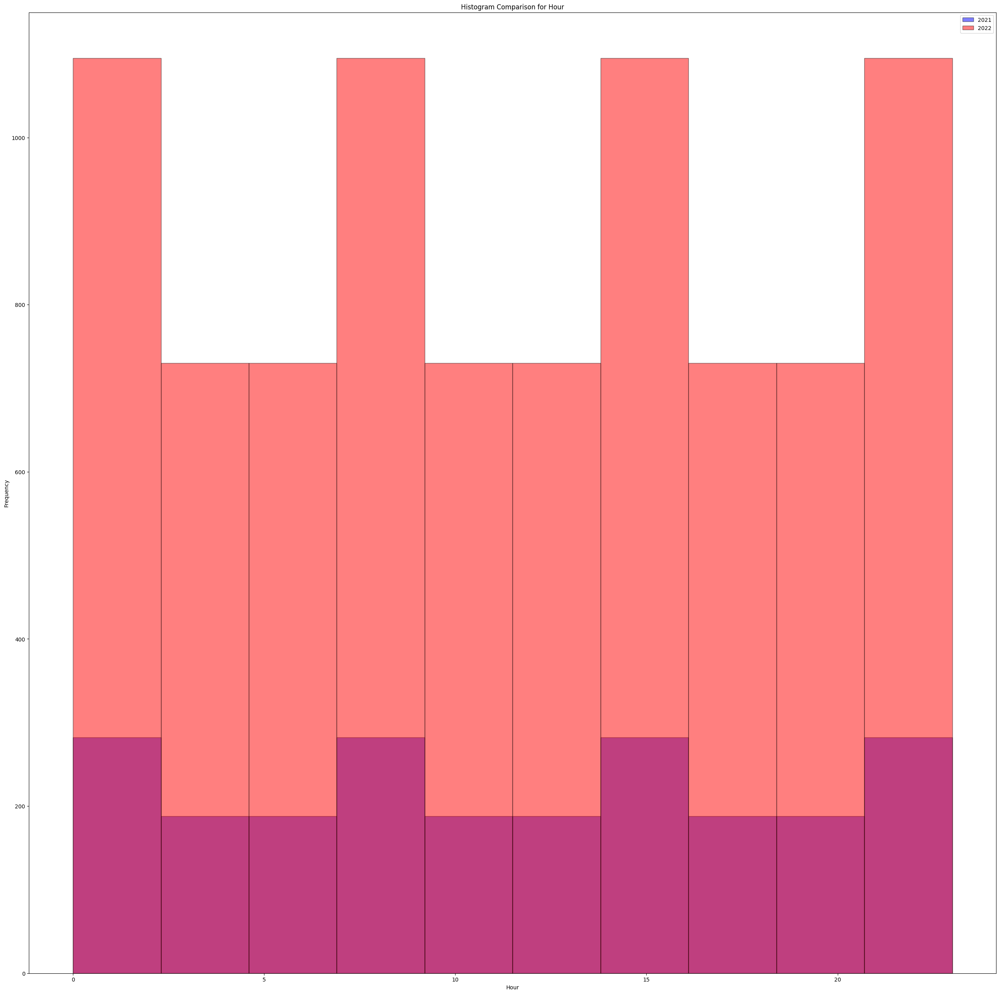

In [20]:
int64_columns_2021 = df2021.select_dtypes(include=['int64', 'float32'])
int64_columns_2022 = df2022.select_dtypes(include=['int64', 'float32'])

for column in int64_columns_2021.columns:
    print("Column:", column)
    
    # Describe statistics for the first dataset (2021)
    display(int64_columns_2021[column].describe())
    
    # Describe statistics for the second dataset (2022)
    display(int64_columns_2022[column].describe())
    
    # Calculate and display the absolute difference in means between the two datasets
    mean_diff = abs(int64_columns_2021[column].mean() - int64_columns_2022[column].mean())
    print("Mean Difference:", mean_diff)
    
    # Calculate and display the absolute difference in standard deviations between the two datasets
    std_diff = abs(int64_columns_2021[column].std() - int64_columns_2022[column].std())
    print("Std Deviation Difference:", std_diff)
    
    print("\n")
    plt.figure(figsize=(32, 32))
    
    # Plot a histogram for the first dataset (2021)
    plt.hist(int64_columns_2021[column].dropna(), bins=10, color='blue', alpha=0.5, label='2021', edgecolor='black')
    # Plot a histogram for the second dataset (2022)
    plt.hist(int64_columns_2022[column].dropna(), bins=10, color='red', alpha=0.5, label='2022', edgecolor='black')
    plt.xlabel(column)
    plt.ylabel("Frequency")
    plt.legend(loc='upper right')
    plt.title(f'Histogram Comparison for {column}')
    plt.show()


categorical variavels

Excess


count     2256
unique       5
top       None
freq      1690
Name: Excess, dtype: object

count     8760
unique       5
top       None
freq      6087
Name: Excess, dtype: object

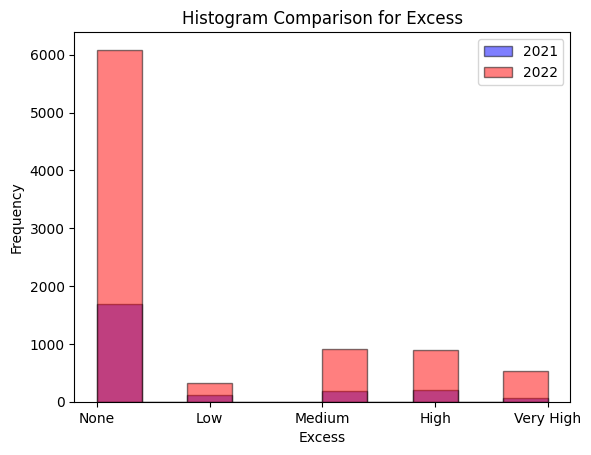

Weather


count             2256
unique               8
top       sky is clear
freq               645
Name: Weather, dtype: object

count             8760
unique               8
top       sky is clear
freq              2365
Name: Weather, dtype: object

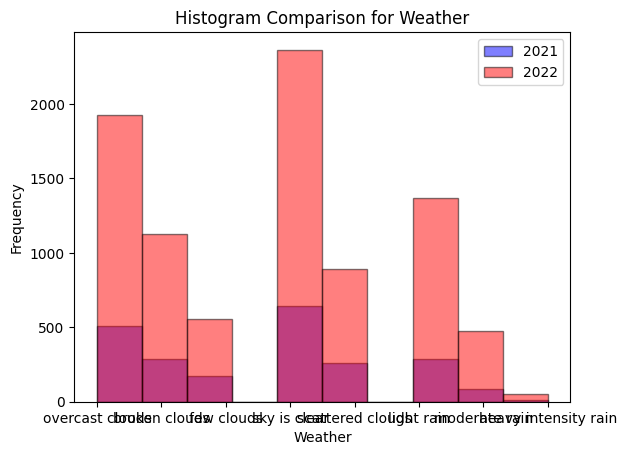

In [21]:
category_columns2021 = df2021.select_dtypes(include=['category'])
category_columns2022 = df2022.select_dtypes(include=['category'])
for column in category_columns2021.columns:
    print(column)
    display(category_columns2021[column].describe())
    display(category_columns2022[column].describe())
    plt.hist(category_columns2021[column].dropna(), bins=10, color='blue', alpha=0.5, label='2021', edgecolor='black')
    # Plot a histogram for the second dataset (2022)
    plt.hist(category_columns2022[column].dropna(), bins=10, color='red', alpha=0.5, label='2022', edgecolor='black')
    plt.xlabel(column)
    plt.ylabel("Frequency")
    plt.legend(loc='upper right')
    plt.title(f'Histogram Comparison for {column}')
    plt.show()

As we can see they are continuous data (end of 2021) and 2022 so we can join the 2 data sets

In [22]:
df = pd.concat([df2021, df2022], ignore_index=True)
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11016 entries, 0 to 11015
Data columns (total 17 columns):
 #   Column            Non-Null Count  Dtype   
---  ------            --------------  -----   
 0   Normal            11016 non-null  float32 
 1   Economical        11016 non-null  float32 
 2   Solar             11016 non-null  float32 
 3   Excess            11016 non-null  category
 4   Temperature       11016 non-null  float32 
 5   ThermalSensation  11016 non-null  float32 
 6   MinTemperature    11016 non-null  float32 
 7   MaxTemperature    11016 non-null  float32 
 8   Pressure          11016 non-null  int64   
 9   Humidity          11016 non-null  int64   
 10  WindSpeed         11016 non-null  float32 
 11  Cloudiness        11016 non-null  int64   
 12  Weather           11016 non-null  category
 13  Year              11016 non-null  int64   
 14  Month             11016 non-null  int64   
 15  Day               11016 non-null  int64   
 16  Hour              1101

Treat Outliers

In [23]:
threshold = 2  # You can adjust this value as needed

# Calculate z-scores for numeric columns
numeric_columns = df.select_dtypes(include=['number'])
z_scores = (numeric_columns - numeric_columns.mean()) / numeric_columns.std()

# Replace outliers with the nearest acceptable value (clipping)
for col in numeric_columns.columns:
    is_outlier = (z_scores[col].abs() > threshold)
    df[col] = df[col].clip(lower=numeric_columns[col][~is_outlier].min(), upper=numeric_columns[col][~is_outlier].max())
df.describe()

,Normal,Economical,Solar,Temperature,ThermalSensation,MinTemperature,MaxTemperature,Pressure,Humidity,WindSpeed,Cloudiness,Year,Month,Day,Hour
count,11016.000000,11016.000000,11016.000000,11016.000000,11016.000000,11016.000000,11016.000000,11016.000000,11016.000000,11016.000000,11016.000000,11016.000000,11016.000000,11016.000000,11016.000000
mean,0.181084,0.144599,0.108850,16.040709,15.680503,14.124966,17.109753,1018.508533,76.982752,2.625141,54.000908,2021.795207,7.433551,15.803922,11.500000
std,0.274679,0.206969,0.149529,5.363431,5.831155,4.673007,5.701824,5.762347,15.269243,1.349935,40.553002,0.403569,3.578335,8.835905,6.922501
min,0.000000,0.000000,0.000000,4.700000,3.320000,4.290000,4.980000,1006.000000,45.000000,0.060000,0.000000,2021.000000,1.000000,1.000000,0.000000
25%,0.000000,0.000000,0.000000,12.080000,11.507500,10.720000,12.890000,1015.000000,66.000000,1.620000,7.000000,2022.000000,4.000000,8.000000,5.750000
50%,0.000000,0.000000,0.000000,15.625000,15.230000,14.230000,16.260000,1018.000000,81.000000,2.400000,60.000000,2022.000000,8.000000,16.000000,11.500000
75%,0.314000,0.288000,0.227000,19.270000,19.260000,17.490000,20.340000,1022.000000,91.000000,3.420000,98.000000,2022.000000,11.000000,23.000000,17.250000
max,0.901000,0.702000,0.470000,27.690001,28.340000,24.040001,29.600000,1030.000000,100.000000,5.620000,100.000000,2022.000000,12.000000,31.000000,23.000000


In [24]:
df.replace("None", "N/A", inplace=True)
df2023.replace("None", "N/A", inplace=True)


**4. Multivariate analysis**

- grouping
- bins
- statistical dispersion: histogram, box plots, scatter plots, pair plots, correlation matrixes

> scatterplots: plot 2 variables against each other and understand how they move together

> pairplots: plot all variables against each other and understand how they move together

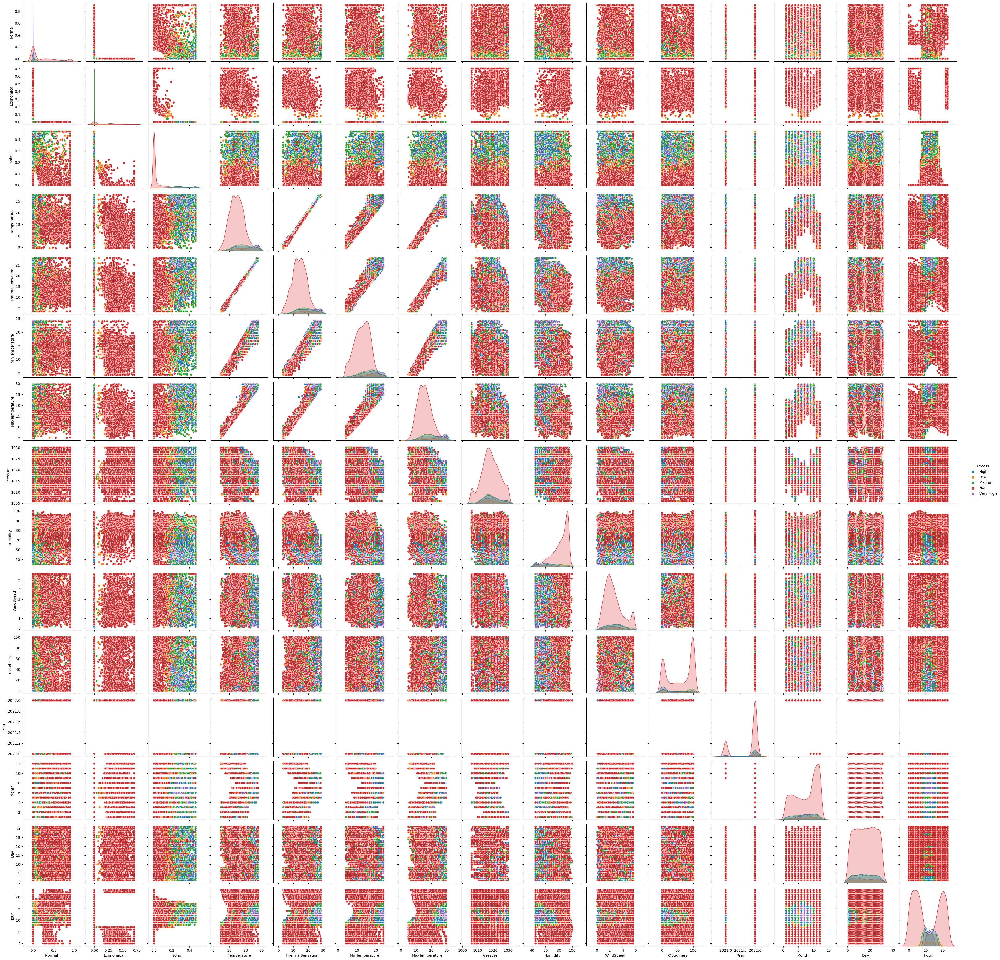

In [25]:
'''
All variables
'''
sns.pairplot(df, hue="Excess")

- As temperaturas sao um bom indicador de energia em exesso
- Quanto mais cedo a hora e mais calor = mais energia
- Mes e temperatura estão bastante relacionados

In [26]:
'''
Grouping
'''
custom_order = ['N/A','Low', 'Medium', 'High', 'Very High']
df.groupby(by=['Excess']).mean(numeric_only=True).loc[custom_order]

,Normal,Economical,Solar,Temperature,ThermalSensation,MinTemperature,MaxTemperature,Pressure,Humidity,WindSpeed,Cloudiness,Year,Month,Day,Hour
Excess,,,,,,,,,,,,,,,
N/A,0.227424,0.204423,0.027676,14.559653,14.158588,12.897780,15.539440,1018.421885,82.076379,2.545229,58.059920,2021.782693,7.629934,15.942008,11.112768
Low,0.189755,0.006877,0.235285,17.195671,16.922361,15.260972,18.246574,1018.312500,75.013889,2.999329,61.261574,2021.747685,7.324074,15.738426,12.333333
Medium,0.106735,0.000125,0.320133,18.199398,17.866777,15.950411,19.292341,1018.500000,69.119308,2.918333,52.997268,2021.834244,6.936248,15.532787,12.340619
High,0.024011,0.000000,0.327392,20.055712,19.762701,17.420326,21.275213,1019.271079,61.122393,2.792004,37.265639,2021.812330,6.904805,15.473255,12.528558
Very High,0.000820,0.000000,0.279860,23.005133,22.935049,19.758532,24.915379,1018.387789,56.133663,2.548977,29.013201,2021.887789,6.854785,15.171617,12.480198


- The less Normal cicle energy consuption the more excess exists
- The Economical cicle energy consuption can tell us if is excess energy was sent to the grid 
- The bigger the temperature the more energy is sent to grid
- Pressure doesn't seem to afect
- The less humid the most energy is sent to the grid
- The less cloudiness the more energy is sent to the grid with exept when no energy is sent
- Since there is a lot more data in the year 2022 there is a shift towards this
- there is more data in the later months so this shift should be ignored
- the day should not afect energy production
- the less the hour the most energy is generated

<AxesSubplot:ylabel='Humidity'>

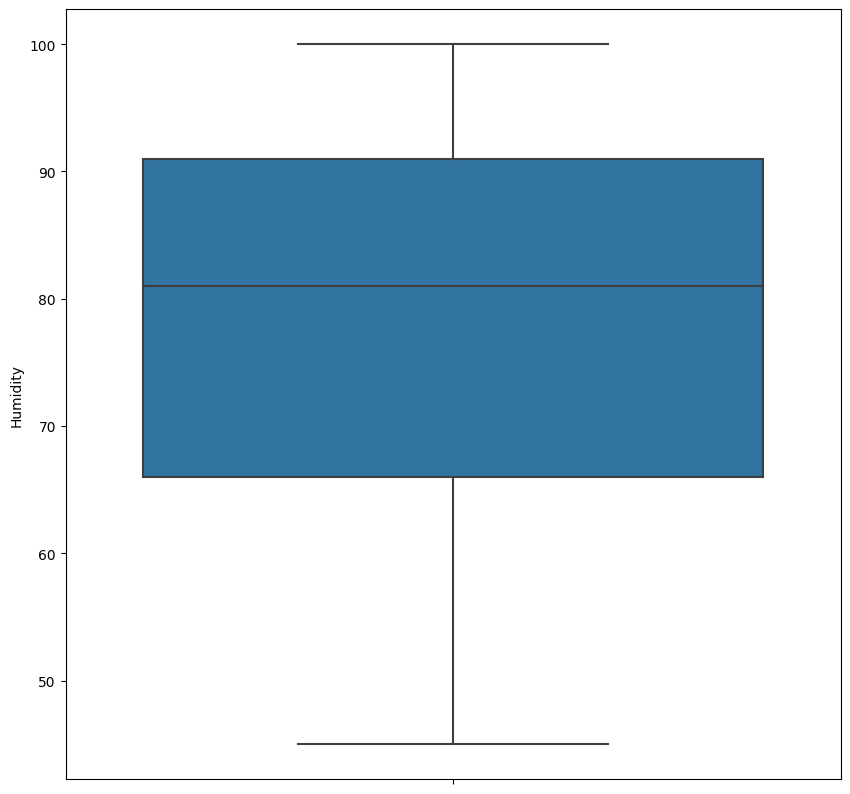

In [27]:
fig, ax = plt.subplots(figsize=(10,10))
sns.boxplot(y=df['Humidity'], ax=ax)

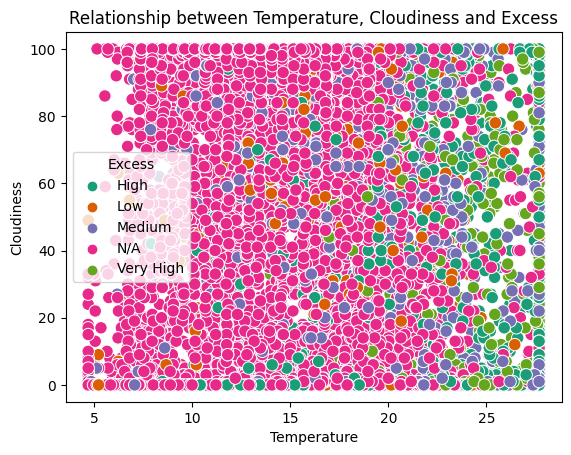

In [28]:
'''
Scatter plots
'''
sns.scatterplot(x="Temperature", y="Cloudiness", hue="Excess", data=df,palette="Dark2",s=80)
plt.title("Relationship between Temperature, Cloudiness and Excess")
plt.show()

<AxesSubplot:>

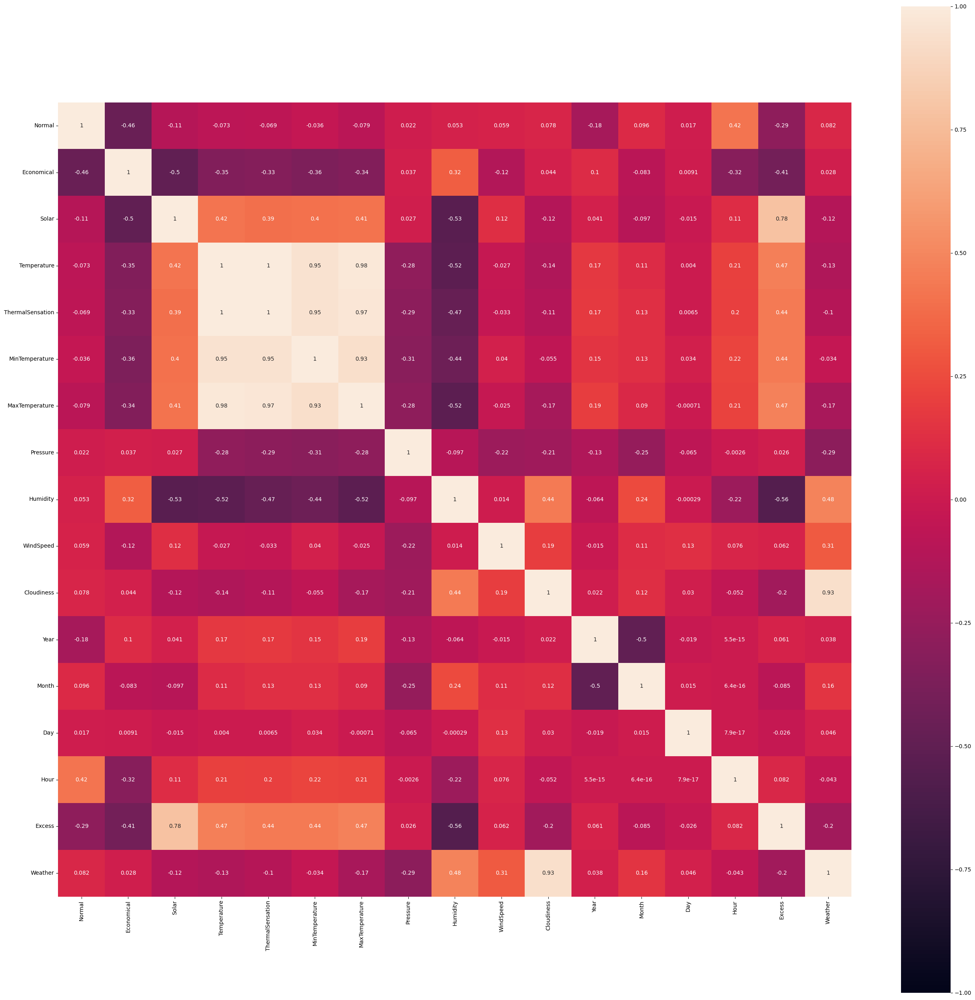

In [29]:
'''
Correlation
'''
df_corr = df.drop(columns=['Excess','Weather'])
df_corr["Excess"] = df["Excess"].map({'N/A':0,'Low':1, 'Medium':2, 'High':3, 'Very High':4}) 
df_corr["Weather"] = df["Weather"].map({'sky is clear':0,'few clouds':1, 'scattered clouds':2, 'broken clouds':3, 'overcast clouds':4,'light rain':5,'moderate rain':6,'heavy intensity rain':7})
corr_matrix = df_corr.corr(numeric_only=False)

f, ax = plt.subplots(figsize=(32, 32))
sns.heatmap(corr_matrix, vmin=-1, square=True, annot=True)

- All temperatures are higly correclated
- The hour is highly correlated to the energy to the grid
- Humidity and temperature
- Preticipation and cloudiness are highly correlated to weather
- Solar enegy used,humiditt and hour is highly correlated to the energy tot eh grid while Pressure,windspeed,Year and day don't show a correlation

In [30]:
from sklearn.linear_model import LinearRegression,LogisticRegression,SGDClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score,accuracy_score,confusion_matrix,precision_score, recall_score, f1_score
from sklearn.model_selection import KFold
from sklearn.preprocessing import PolynomialFeatures
from sklearn import svm
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.naive_bayes import MultinomialNB
from sklearn.cluster import KMeans
from sklearn_extra.cluster import KMedoids

folds=10

In [31]:
df["Weather"] = df["Weather"].map({'sky is clear':0,'few clouds':1, 'scattered clouds':2, 'broken clouds':3, 'overcast clouds':4,'light rain':5,'moderate rain':6,'heavy intensity rain':7})
df2023["Weather"] = df2023["Weather"].map({'sky is clear':0,'few clouds':1, 'scattered clouds':2, 'broken clouds':3, 'overcast clouds':4,'light rain':5,'moderate rain':6,'heavy intensity rain':7})
df["Weather"] = df["Weather"].astype('int64')
df2023["Weather"] = df2023["Weather"].astype('int64')

df_shuffled = df.sample(frac=1, random_state=25)
kf = KFold(n_splits=folds, shuffle=True, random_state=25)

In [32]:
X = df_shuffled.drop(['Excess','Pressure','WindSpeed','Year','Day','MinTemperature'], axis=1)
predict = df2023.drop(['Pressure','WindSpeed','Year','Day','MinTemperature'], axis=1)
y = df_shuffled['Excess']
submit = True
results={}

def resultToOriginalValue(x):
    return ["None" if i=="N/A" else i for i in x]

## Logistical Regression

/home/luismfp/miniconda3/envs/DAA1/lib/python3.10/site-packages/sklearn/utils/optimize.py:211: ConvergenceWarning: newton-cg failed to converge. Increase the number of iterations.
  warnings.warn(
/home/luismfp/miniconda3/envs/DAA1/lib/python3.10/site-packages/sklearn/utils/optimize.py:211: ConvergenceWarning: newton-cg failed to converge. Increase the number of iterations.
  warnings.warn(
/home/luismfp/miniconda3/envs/DAA1/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/luismfp/miniconda3/envs/DAA1/lib/python3.10/site-packages/sklearn/utils/optimize.py:211: ConvergenceWarning: newton-cg failed to converge. Increase the number of iterations.
  warnings.warn(
/home/luismfp/miniconda3/envs/DAA1/lib/python3.10/site-packages/sklearn/utils/optimize

Mean accuracy: 0.8392332659140098
Mean f1: 0.8258967186576734
Mean precision: 0.8220719841911782


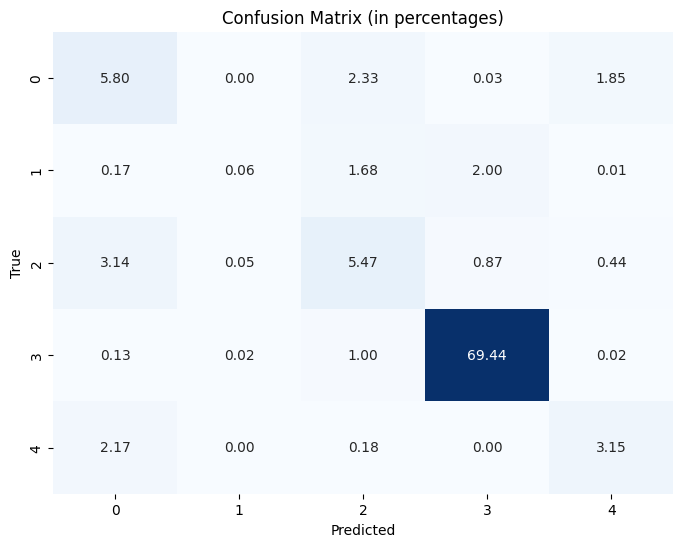

In [36]:
# Create a Logistic Regression model
model = LogisticRegression(solver='newton-cg',penalty=None,random_state=25,n_jobs=6)  # You can specify the solver as needed
result={}
if submit:
    model.fit(X, y)
    y_predict=model.predict(predict)
    pd.DataFrame({'RowId':range(1,len(y_predict)+1),'Result': list(map(lambda x: "None" if x=="N/A" else x ,y_predict))}).to_csv('submission.csv', index=False)
    result['results']=resultToOriginalValue(y_predict)

# Lists to store accuracy scores for each fold
scores={"accuracy":[],"f1":[],"precision":[]}
confusion_matrices = []

for train_index, test_index in kf.split(X):
    X_train, X_test = X.iloc[train_index], X.iloc[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]
    # Fit the logistic regression model to the training data
    model.fit(X_train, y_train)
    # Make predictions on the test data
    y_pred = model.predict(X_test)
    # Calculate the accuracy score for this fold
    confusion_matrices.append(confusion_matrix(y_test, y_pred))
    scores["accuracy"].append(accuracy_score(y_test, y_pred))
    scores["f1"].append(f1_score(y_test, y_pred, average='weighted'))
    scores["precision"].append(precision_score(y_test, y_pred, average='weighted'))
    
# Calculate the mean accuracy score across all folds
mean_confusion = sum(confusion_matrices) / folds
mean_confusion_percentage = (mean_confusion / mean_confusion.sum()) * 100
for k,i in scores.items():
    print(f"Mean {k}: {sum(i) / folds}")
    result[k]=sum(i) / folds
results['LogisticRegression']=result
plt.figure(figsize=(8, 6))
sns.heatmap(mean_confusion_percentage, annot=True, fmt=".2f", cmap="Blues", cbar=False)
plt.xlabel("Predicted")
plt.ylabel("True")
plt.title("Confusion Matrix (in percentages)")
plt.show()

- 0.7878889841717417
- 0.7885130061094074
- 0.7886678003711187
- 0.7888238058555351
- 0.7892910955751613
- 0.789602622054912
- 0.8392332659140098


## Support Vector Machines

/home/luismfp/miniconda3/envs/DAA1/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/luismfp/miniconda3/envs/DAA1/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/luismfp/miniconda3/envs/DAA1/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/luismfp/miniconda3/envs/D

Mean accuracy: 0.8381440894352767
Mean f1: 0.8246108549115847
Mean precision: 0.8132643343873467


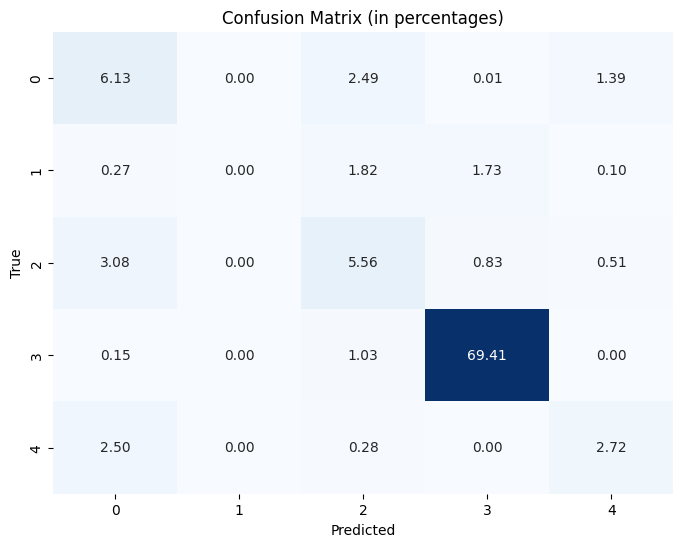

In [37]:
# Create a Logistic Regression model
model = svm.SVC(kernel="linear",random_state=25,cache_size=10000)  # You can specify the solver as needed
result={}
if submit:
    model.fit(X, y)
    y_predict=model.predict(predict)
    pd.DataFrame({'RowId':range(1,len(y_predict)+1),'Result': list(map(lambda x: "None" if x=="N/A" else x ,y_predict))}).to_csv('submission.csv', index=False)
    result['results']=resultToOriginalValue(y_predict)
# Lists to store accuracy scores for each fold
scores={"accuracy":[],"f1":[],"precision":[]}
confusion_matrices = []
    
for train_index, test_index in kf.split(X):
    X_train, X_test = X.iloc[train_index], X.iloc[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]

    # Fit the logistic regression model to the training data
    model.fit(X_train, y_train)

    # Make predictions on the test data
    y_pred = model.predict(X_test)
    
    # Calculate the accuracy score for this fold
    confusion_matrices.append(confusion_matrix(y_test, y_pred))
    scores["accuracy"].append(accuracy_score(y_test, y_pred))
    scores["f1"].append(f1_score(y_test, y_pred, average='weighted'))
    scores["precision"].append(precision_score(y_test, y_pred, average='weighted'))
    

# Calculate the mean accuracy score across all folds
mean_confusion = sum(confusion_matrices) / folds
mean_confusion_percentage = (mean_confusion / mean_confusion.sum()) * 100
for k,i in scores.items():
    print(f"Mean {k}: {sum(i) / folds}")
    result[k]=sum(i) / folds
results['SVC']=result
plt.figure(figsize=(8, 6))
sns.heatmap(mean_confusion_percentage, annot=True, fmt=".2f", cmap="Blues", cbar=False)
plt.xlabel("Predicted")
plt.ylabel("True")
plt.title("Confusion Matrix (in percentages)")
plt.show()

- 0.7771519793801447
- 0.7791764170094428
- 0.7752871809033783
- 0.7847778375314312
- 0.7858657577651489
- 0.7852439160283524
- 0.8381440894352767

## Stochastic Gradient Descent

/home/luismfp/miniconda3/envs/DAA1/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/luismfp/miniconda3/envs/DAA1/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Mean accuracy: 0.7795969181621725
Mean f1: 0.7690298186516153
Mean precision: 0.802875338799366


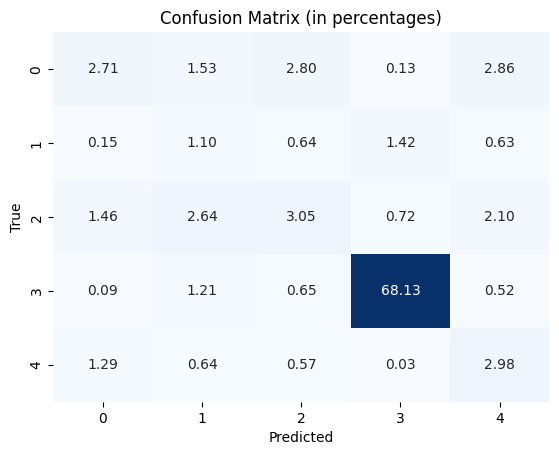

In [39]:
# Create an SGDClassifier model
model = SGDClassifier(loss="log_loss",penalty="l1", random_state=25)

result={}
if submit:
    model.fit(X, y)
    y_predict=model.predict(predict)
    pd.DataFrame({'RowId':range(1,len(y_predict)+1),'Result': list(map(lambda x: "None" if x=="N/A" else x ,y_predict))}).to_csv('submission.csv', index=False)
    result['results']=resultToOriginalValue(y_predict)
    
# Lists to store accuracy scores for each fold
scores={"accuracy":[],"f1":[],"precision":[]}
confusion_matrices = []
    
for train_index, test_index in kf.split(X):
    X_train, X_test = X.iloc[train_index], X.iloc[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]

    # Fit the SGDClassifier model to the training data
    model.fit(X_train, y_train)

    # Make predictions on the test data
    y_pred = model.predict(X_test)
    

    # Calculate the accuracy score for this fold
    confusion_matrices.append(confusion_matrix(y_test, y_pred))
    scores["accuracy"].append(accuracy_score(y_test, y_pred))
    scores["f1"].append(f1_score(y_test, y_pred, average='weighted'))
    scores["precision"].append(precision_score(y_test, y_pred, average='weighted'))
    

# Calculate the mean accuracy score across all folds
mean_confusion = sum(confusion_matrices) / folds
mean_confusion_percentage = (mean_confusion / mean_confusion.sum()) * 100
for k,i in scores.items():
    print(f"Mean {k}: {sum(i) / folds}")
    result[k]=sum(i) / folds
results['SGDClassifier']=result
sns.heatmap(mean_confusion_percentage, annot=True, fmt=".2f", cmap="Blues", cbar=False)
plt.xlabel("Predicted")
plt.ylabel("True")
plt.title("Confusion Matrix (in percentages)")
plt.show()

- 0.6336654505990708
- 0.6553032174919938
- 0.6548453753094675
- 0.6945172793031109
- 0.707292287418303
- 0.7052501659375107
- 0.7795969181621725

## NearestNeighbors

Mean accuracy: 0.7594401888400415
Mean f1: 0.7502592002709498
Mean precision: 0.7456154386719953


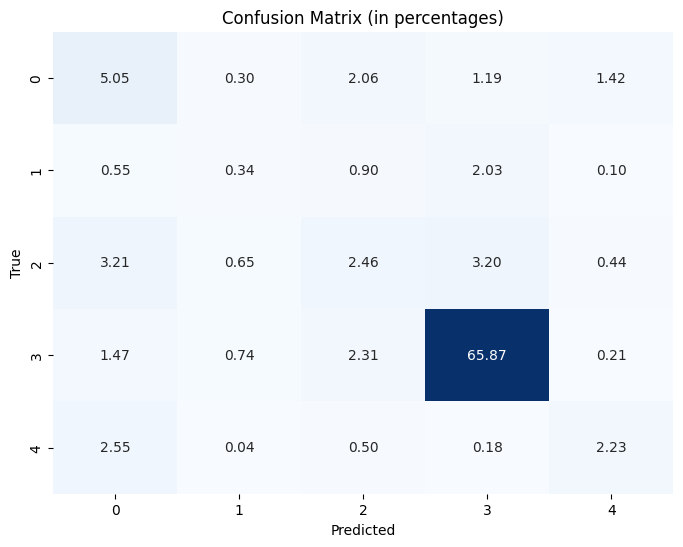

In [101]:
# Create a KNeighborsClassifier model
model = KNeighborsClassifier(n_neighbors=5)  # You can adjust n_neighbors and other hyperparameters as needed
result={}
if submit:
    model.fit(X, y)
    y_predict=model.predict(predict)
    result['results']=resultToOriginalValue(y_predict)
    
# Lists to store accuracy scores for each fold
scores={"accuracy":[],"f1":[],"precision":[]}
confusion_matrices = []
    
for train_index, test_index in kf.split(X):
    X_train, X_test = X.iloc[train_index], X.iloc[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]

    # Fit the KNeighborsClassifier model to the training data
    model.fit(X_train, y_train)

    # Make predictions on the test data
    y_pred = model.predict(X_test)

    # Calculate the accuracy score for this fold
    confusion_matrices.append(confusion_matrix(y_test, y_pred))
    scores["accuracy"].append(accuracy_score(y_test, y_pred))
    scores["f1"].append(f1_score(y_test, y_pred, average='weighted'))
    scores["precision"].append(precision_score(y_test, y_pred, average='weighted'))
    

# Calculate the mean accuracy score across all folds
mean_confusion = sum(confusion_matrices) / folds
mean_confusion_percentage = (mean_confusion / mean_confusion.sum()) * 100
for k,i in scores.items():
    print(f"Mean {k}: {sum(i) / folds}")
    result[k]=sum(i) / folds
results['KNeighborsClassifier']=result
plt.figure(figsize=(8, 6))
sns.heatmap(mean_confusion_percentage, annot=True, fmt=".2f", cmap="Blues", cbar=False)
plt.xlabel("Predicted")
plt.ylabel("True")
plt.title("Confusion Matrix (in percentages)")
plt.show()

- 0.667601730595001
- 0.6665104189377091
- 0.6668219454174599
- 0.6772488771965525
- 0.6789596081452304
- 0.7594401888400415

## Decision tree classifier

Mean accuracy: 0.852395281636394
Mean f1: 0.852806186906715
Mean precision: 0.8538354254154831


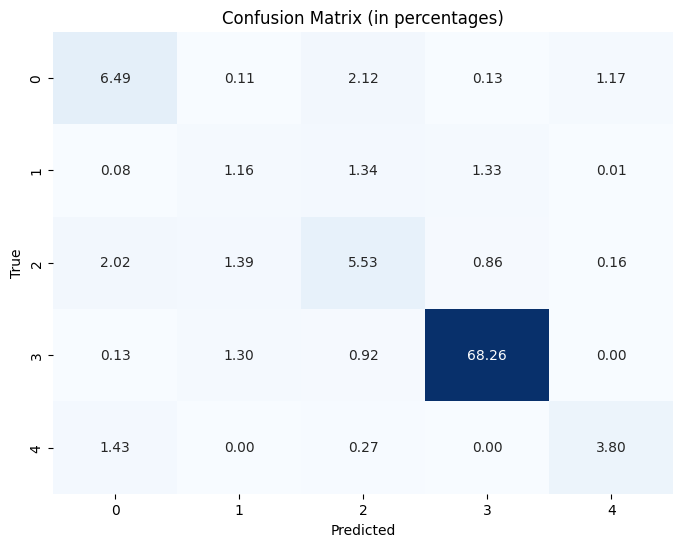

In [102]:
# Create a KNeighborsClassifier model
model = DecisionTreeClassifier(splitter="best",criterion="entropy",random_state=25)
result={}
if submit:
    model.fit(X, y)
    y_predict=model.predict(predict)
    result['results']=resultToOriginalValue(y_predict)
    
# Lists to store accuracy scores for each fold
scores={"accuracy":[],"f1":[],"precision":[]}
confusion_matrices = []
    
for train_index, test_index in kf.split(X):
    X_train, X_test = X.iloc[train_index], X.iloc[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]

    # Fit the KNeighborsClassifier model to the training data
    model.fit(X_train, y_train)

    # Make predictions on the test data
    y_pred = model.predict(X_test)

    # Calculate the accuracy score for this fold
    confusion_matrices.append(confusion_matrix(y_test, y_pred))
    scores["accuracy"].append(accuracy_score(y_test, y_pred))
    scores["f1"].append(f1_score(y_test, y_pred, average='weighted'))
    scores["precision"].append(precision_score(y_test, y_pred, average='weighted'))
    

# Calculate the mean accuracy score across all folds
mean_confusion = sum(confusion_matrices) / folds
mean_confusion_percentage = (mean_confusion / mean_confusion.sum()) * 100
for k,i in scores.items():
    print(f"Mean {k}: {sum(i) / folds}")
    result[k]=sum(i) / folds
results['DecisionTreeClassifier']=result
plt.figure(figsize=(8, 6))
sns.heatmap(mean_confusion_percentage, annot=True, fmt=".2f", cmap="Blues", cbar=False)
plt.xlabel("Predicted")
plt.ylabel("True")
plt.title("Confusion Matrix (in percentages)")
plt.show()

- 0.7920924114475081
- 0.7966093031593533
- 0.7990993347964904
- 0.7928772837604106
- 0.789451945950398
- 0.7928755880486233
- 0.852395281636394

## Random Forest

Mean accuracy: 0.8819891502692652
Mean f1: 0.877057617116966
Mean precision: 0.8779357566177459


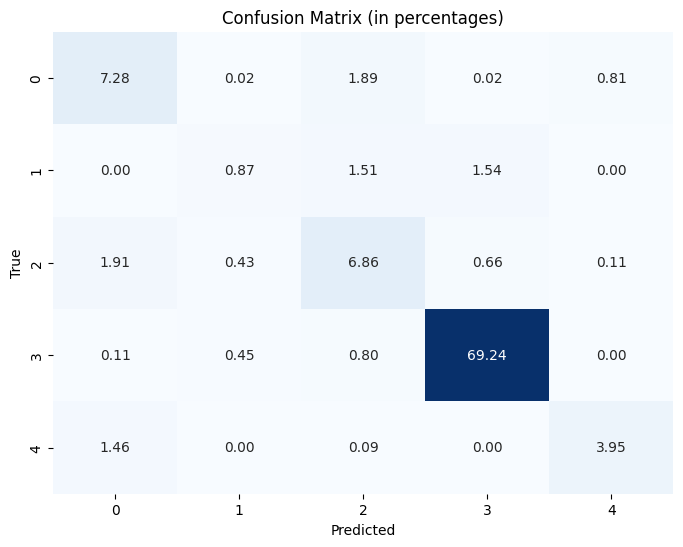

In [103]:
# Create a KNeighborsClassifier model
model = RandomForestClassifier(n_estimators=5000,min_samples_split=3,min_samples_leaf=1,max_features="sqrt",random_state=25,n_jobs=-1)
result={}
if submit:
    model.fit(X, y)
    y_predict=model.predict(predict)
    result['results']=resultToOriginalValue(y_predict)

# Lists to store accuracy scores for each fold
scores={"accuracy":[],"f1":[],"precision":[]}
confusion_matrices = []
    
for train_index, test_index in kf.split(X):
    X_train, X_test = X.iloc[train_index], X.iloc[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]

    # Fit the KNeighborsClassifier model to the training data
    model.fit(X_train, y_train)

    # Make predictions on the test data
    y_pred = model.predict(X_test)

    # Calculate the accuracy score for this fold
    confusion_matrices.append(confusion_matrix(y_test, y_pred))
    scores["accuracy"].append(accuracy_score(y_test, y_pred))
    scores["f1"].append(f1_score(y_test, y_pred, average='weighted'))
    scores["precision"].append(precision_score(y_test, y_pred, average='weighted'))
    

# Calculate the mean accuracy score across all folds
mean_confusion = sum(confusion_matrices) / folds
mean_confusion_percentage = (mean_confusion / mean_confusion.sum()) * 100
for k,i in scores.items():
    print(f"Mean {k}: {sum(i) / folds}")
    result[k]=sum(i) / folds
results['RandomForestClassifier']=result
plt.figure(figsize=(8, 6))
sns.heatmap(mean_confusion_percentage, annot=True, fmt=".2f", cmap="Blues", cbar=False)
plt.xlabel("Predicted")
plt.ylabel("True")
plt.title("Confusion Matrix (in percentages)")
plt.show()

- 0.8802647650790982 100 estimators,2 min_samples_split,1 min_samples_leaf
- 0.8810821213514854 500 estimators
- 0.881263115036487 1000 estimators
- 0.8817163410263891 3 min_samples_split
- 0.8819891502692652 5000 estimators
- 

## Multinomial Naive Bayes

Mean accuracy: 0.5587303078705879
Mean f1: 0.5936878891478877
Mean precision: 0.6625523626544325


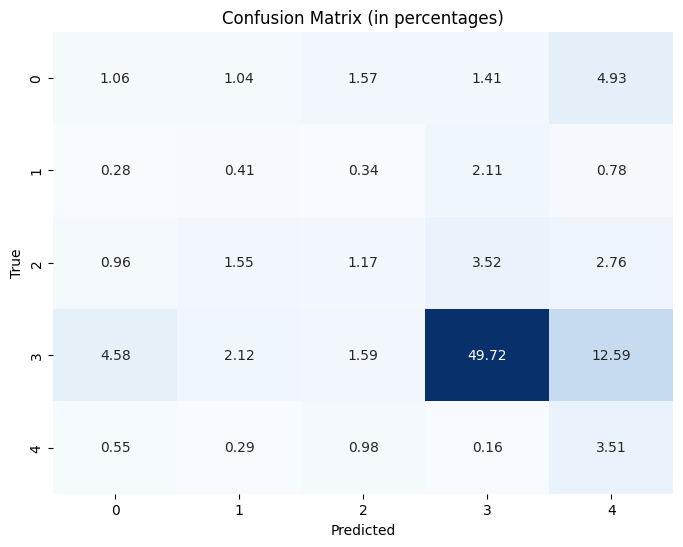

In [104]:
# Create a KNeighborsClassifier model
model = MultinomialNB(alpha=1,force_alpha=False)
result={}
if submit:
    model.fit(X, y)
    y_predict=model.predict(predict)
    result['results']=resultToOriginalValue(y_predict)
    #pd.DataFrame({'RowId':range(1,len(y_predict)+1),'Result': resultToOriginalValue(y_predict)}).to_csv('submission.csv', index=False)

# Lists to store accuracy scores for each fold
scores={"accuracy":[],"f1":[],"precision":[]}
confusion_matrices = []
    
for train_index, test_index in kf.split(X):
    X_train, X_test = X.iloc[train_index], X.iloc[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]

    # Fit the KNeighborsClassifier model to the training data
    model.fit(X_train, y_train)

    # Make predictions on the test data
    y_pred = model.predict(X_test)

    # Calculate the accuracy score for this fold
    confusion_matrices.append(confusion_matrix(y_test, y_pred))
    scores["accuracy"].append(accuracy_score(y_test, y_pred))
    scores["f1"].append(f1_score(y_test, y_pred, average='weighted'))
    scores["precision"].append(precision_score(y_test, y_pred, average='weighted'))
    

# Calculate the mean accuracy score across all folds
mean_confusion = sum(confusion_matrices) / folds
mean_confusion_percentage = (mean_confusion / mean_confusion.sum()) * 100
for k,i in scores.items():
    print(f"Mean {k}: {sum(i) / folds}")
    result[k]=sum(i) / folds
results['MultinomialNB']=result
plt.figure(figsize=(8, 6))
sns.heatmap(mean_confusion_percentage, annot=True, fmt=".2f", cmap="Blues", cbar=False)
plt.xlabel("Predicted")
plt.ylabel("True")
plt.title("Confusion Matrix (in percentages)")
plt.show()

## K-Mean

Mean accuracy: 0.37146019704904465
Mean f1: 0.4493668313868315
Mean precision: 0.6514091403043379


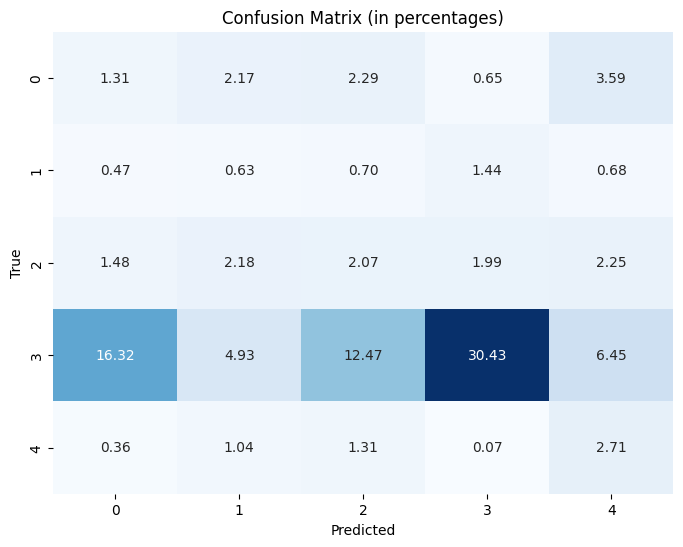

In [105]:
from collections import defaultdict
# Create a KNeighborsClassifier model
model = KMeans(n_clusters=5,n_init=10,max_iter=300,random_state=25,algorithm="lloyd")
result={}


def listOfUses(x):
    def r0():
        return 0
    d = defaultdict(r0)
    for i in x:
        d[i]+=1
    l = list(d.items())
    l.sort(key=lambda x: x[1],reverse=True)
    return list(map(lambda x: x[0],l))


if submit:
    model.fit(X)
    y_predict=model.predict(predict)
    
    y_pred_order = listOfUses(y_predict)
    y_train_order = listOfUses(y)
    clustersMapping = dict(zip(y_pred_order,y_train_order))
    y_predict = list(map(lambda x: clustersMapping[x],y_predict))
    result['results']=resultToOriginalValue(y_predict)
    
# Lists to store accuracy scores for each fold
scores={"accuracy":[],"f1":[],"precision":[]}
confusion_matrices = []
    
for train_index, test_index in kf.split(X):
    X_train, X_test = X.iloc[train_index], X.iloc[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]

    # Fit the KNeighborsClassifier model to the training data
    model.fit(X_train)

    # Make predictions on the test data
    y_pred = model.predict(X_test)
    y_pred_order = listOfUses(y_pred)
    y_train_order = listOfUses(y_train)
    clustersMapping = dict(zip(y_pred_order,y_train_order))
    y_pred = list(map(lambda x: clustersMapping[x],y_pred))

    # Calculate the accuracy score for this fold
    confusion_matrices.append(confusion_matrix(y_test, y_pred))
    scores["accuracy"].append(accuracy_score(y_test, y_pred))
    scores["f1"].append(f1_score(y_test, y_pred, average='weighted'))
    scores["precision"].append(precision_score(y_test, y_pred, average='weighted'))
    

# Calculate the mean accuracy score across all folds
mean_confusion = sum(confusion_matrices) / folds
mean_confusion_percentage = (mean_confusion / mean_confusion.sum()) * 100
for k,i in scores.items():
    print(f"Mean {k}: {sum(i) / folds}")
    result[k]=sum(i) / folds
results['KMeans']=result
plt.figure(figsize=(8, 6))
sns.heatmap(mean_confusion_percentage, annot=True, fmt=".2f", cmap="Blues", cbar=False)
plt.xlabel("Predicted")
plt.ylabel("True")
plt.title("Confusion Matrix (in percentages)")
plt.show()

### Set a score to each model and vote what answer is the best

In [110]:
d={"None":0,"Low":0,"Medium":0,"High":0,"Very High":0}
r=[]
first=True
for k,v in results.items():
    score = (0.3*v['accuracy']+0.3*v['f1']+0.4*v['precision'])**13
    print(k,score)
    for p,i in enumerate(v["results"]):
        if first==True:
            r.append(d.copy())
        r[p][i]+=score
    first=False

def getMax(x):
    m=-1
    r=""
    for k,v in x.items():
        if v>m:
            m=v
            r=k
    return r
result = list(map(getMax,r))

pd.DataFrame({'RowId':range(1,len(result)+1),'Result': result}).to_csv('submission.csv', index=False)

LogisticRegression 0.08647720410541657
SVC 0.08090206284557272
SGDClassifier 0.04351229267572634
KNeighborsClassifier 0.024237720287453374
DecisionTreeClassifier 0.12675455620502463
RandomForestClassifier 0.18669732307569784
MultinomialNB 0.0016450986390794237
KMeans 0.0001455482336324393
